# Interference from Drone Electronics and Communication

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def voltage_to_dbm(voltage):
    if voltage > 2:
        return (2.0 / -0.025) + 20.0  # -60 dB
    elif voltage < 0.5:
        return (0.5 / -0.025) + 20.0  # 0 dB
    else:
        return (voltage / -0.025) + 20.0
def make_plot(raw_files: list, processed_files: list):
    # Dictionary to store averages
    average_dbm_per_file = {}
    average_median_dbm_per_file = {}

    # Create subplots
    fig, axes = plt.subplots(3, 2, figsize=(16, 12)) # Increased height slightly for labels
    fig.suptitle("Sensor Data Comparison", fontsize=16)

    # --- Process and plot raw data ---
    num_raw_plots = min(len(raw_files), 2) # Ensure we don't try to plot more than 2 raw files if only 2 columns
    for i in range(num_raw_plots):
        file = raw_files[i]
        df = pd.read_csv(file)
        filename = os.path.basename(file).replace(".csv", "")
        custom_param = filename.split("_")[-1]

        if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
            df["dBm"] = df["Value"].apply(voltage_to_dbm)
            # Use scatter for raw data points instead of line with '.' marker
            axes[0, i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1) # s=1 for small points
            axes[0, i].set_title(f"Raw Data - {custom_param}")
            axes[0, i].set_xlabel("Elapsed Time (s)")
            axes[0, i].set_ylabel("dBm")
            # axes[0, i].set_ylim(-60, -15) # Set common ylim later
            axes[0, i].grid(True)
        else:
             print(f"Warning: Columns 'Elapsed Time (s)' or 'Value' not found in {file}")
             axes[0, i].set_title(f"Raw Data - {custom_param} (Error)")


    # --- Process and plot processed data ---
    if not processed_files:
        print("Warning: No processed files provided.")
        # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
        for j in range(2):
           axes[1, j].set_visible(False)
           axes[2, j].set_visible(False)

    for file in processed_files:
        try:
            df = pd.read_csv(file)
            filename = os.path.basename(file)
            custom_param = filename.split("_")[-1].replace(".csv", "")

            if {"Average", "Median"}.issubset(df.columns):
                # Calculate overall average/median for the summary plots later
                # Using .mean() on the columns assumes each row in the processed file
                # represents a window/segment. If the processed file *already* contains
                # the single overall average/median, this calculation might be wrong.
                # Assuming the former (multiple rows per file):
                file_avg_average = df["Average"].mean()
                file_avg_median = df["Median"].mean()
                
                # Check for NaN/infinite values which can cause issues
                if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                     average_dbm_per_file[custom_param] = file_avg_average
                     average_median_dbm_per_file[custom_param] = file_avg_median
                else:
                    print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                    continue # Skip plotting this file if averages are invalid

                # Plot the time series (or index series) of Average and Median
                # Assuming the index represents time or sequence if no specific time column exists
                axes[1, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
                axes[1, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

            else:
                print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
                # Potentially disable the plot for this file if columns are missing

        except Exception as e:
            print(f"Error processing file {file}: {e}")
            continue # Skip to the next file if reading/processing fails


    # Titles and legends for processed data plots
    axes[1, 0].set_title("Windowed Average (dBm)")
    axes[1, 1].set_title("Windowed Median (dBm)")
    axes[1, 0].set_xlabel("Window Index") # Or Time if applicable
    axes[1, 1].set_xlabel("Window Index") # Or Time if applicable
    axes[1, 0].set_ylabel("dBm")
    axes[1, 1].set_ylabel("dBm")
    if processed_files: # Only add legend if there's data
        axes[1, 0].legend()
        axes[1, 1].legend()
    axes[1, 0].grid(True)
    axes[1, 1].grid(True)


    # --- Plot average of "Average" per file ---
    # Get the file names (categories) and values for the plot
    avg_file_names = list(average_dbm_per_file.keys())
    avg_values = list(average_dbm_per_file.values())

    axes[2, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
    # Add text labels above markers
    for file_name, avg_value in average_dbm_per_file.items():
        axes[2, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                         ha='center',    # Horizontal alignment
                         va='bottom',    # Vertical alignment
                         fontsize=9)     # Adjust font size as needed

    axes[2, 0].set_title("Overall Average of 'Average' per File (dBm)")
    axes[2, 0].set_xlabel("Custom Parameter (from filename)")
    axes[2, 0].set_ylabel("dBm")
    axes[2, 0].tick_params(axis='x', rotation=45)
    axes[2, 0].grid(True)


    # --- Plot average of "Median" per file ---
     # Get the file names (categories) and values for the plot
    med_file_names = list(average_median_dbm_per_file.keys())
    med_values = list(average_median_dbm_per_file.values())

    axes[2, 1].scatter(med_file_names, med_values, color="g", marker="s")
    # Add text labels above markers
    for file_name, avg_value in average_median_dbm_per_file.items():
        axes[2, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                         ha='center',    # Horizontal alignment
                         va='bottom',    # Vertical alignment
                         fontsize=9)     # Adjust font size as needed

    axes[2, 1].set_title("Overall Average of 'Median' per File (dBm)")
    axes[2, 1].set_xlabel("Custom Parameter (from filename)")
    axes[2, 1].set_ylabel("dBm")
    axes[2, 1].tick_params(axis='x', rotation=45)
    axes[2, 1].grid(True)

    # Set common y-limits for all plots for better comparison
    common_ylim = (-65, -15)
    for i in range(3):
        for j in range(2):
            if axes[i,j].has_data(): # Only set ylim if plot has data
                axes[i,j].set_ylim(common_ylim)

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
    plt.show()

Drone powered on

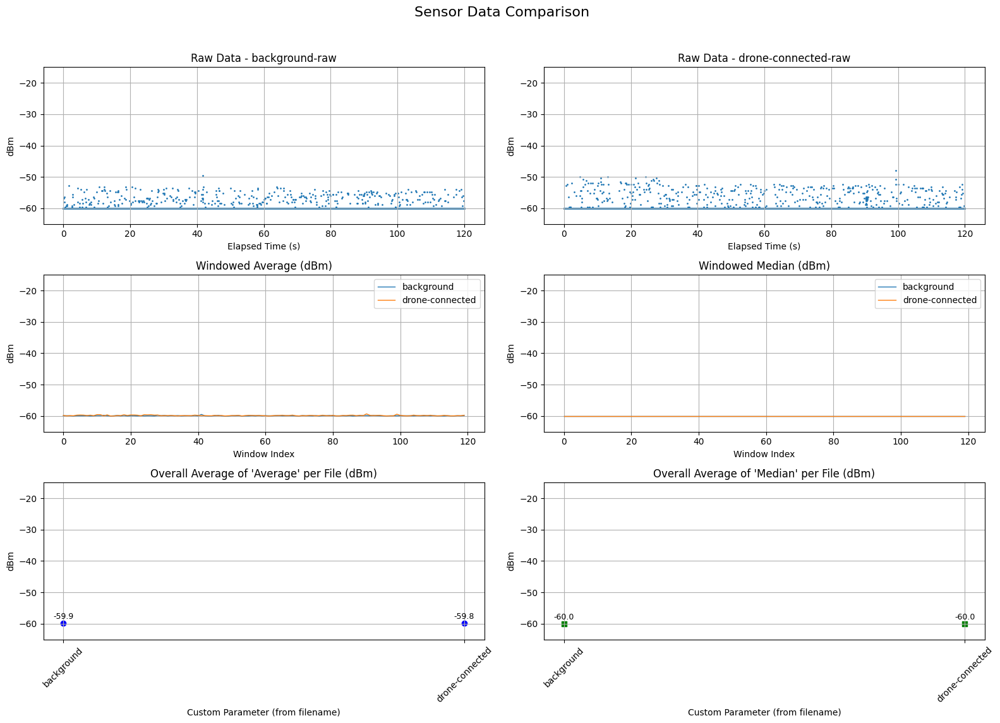

In [3]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-19-04_background-raw.csv",
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv"
]
make_plot(raw_files,processed_files)


To quantify the Baseline measurement: Measuring the background signal without any active drone components a measurement was conducted of 2 minutes, the raw values can be seen in subplot a and as we can observe, measured data is -60 and -50 dbm. When averaged in bins of 1 second it becomes cleared that on average and median shows us -60 dbm. Now to see the influence of Drone powered on: Evaluating the effect of the battery and electronics.as can be observed in subplot b, the signal is higher when looking at the raw data but after averaging this effect disappears and the Average and median are same to the backgound noise. So we can conclude that the battery and other drone electronics have no influence on the drone.

Motor interference

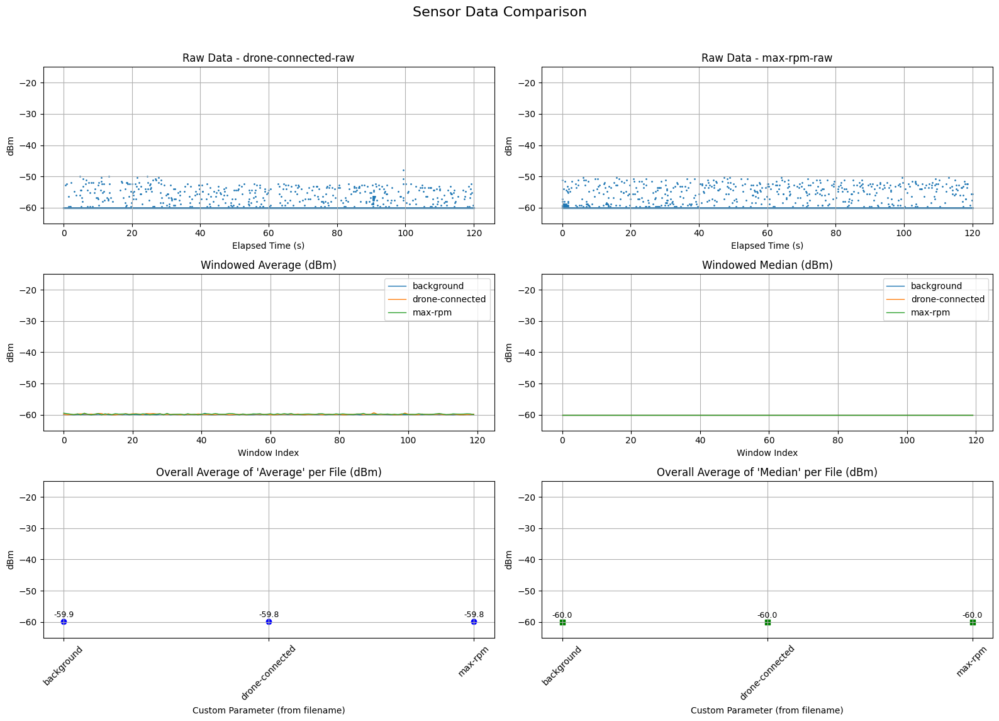

In [4]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-34-12_max-rpm-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv"
]
make_plot(raw_files,processed_files)



Now Motor interference: Measuring the signal when motors are spinning at maximum RPM to assess the
impact of the electromagnetic field induced by the motors. In the raw data we can see that It has a small effect on the measured signal, however this is again only in the sparse portion of the signal and most of the measured values remain -60 dbm. Also the averages and the medians are similar to the background and drone connected scenarios. So the conculsion that can be made from this is that the electromagnetic field induced by the motors has an effect but this effect is negligible when averaged oud over each second.

Propeller vibration analysis

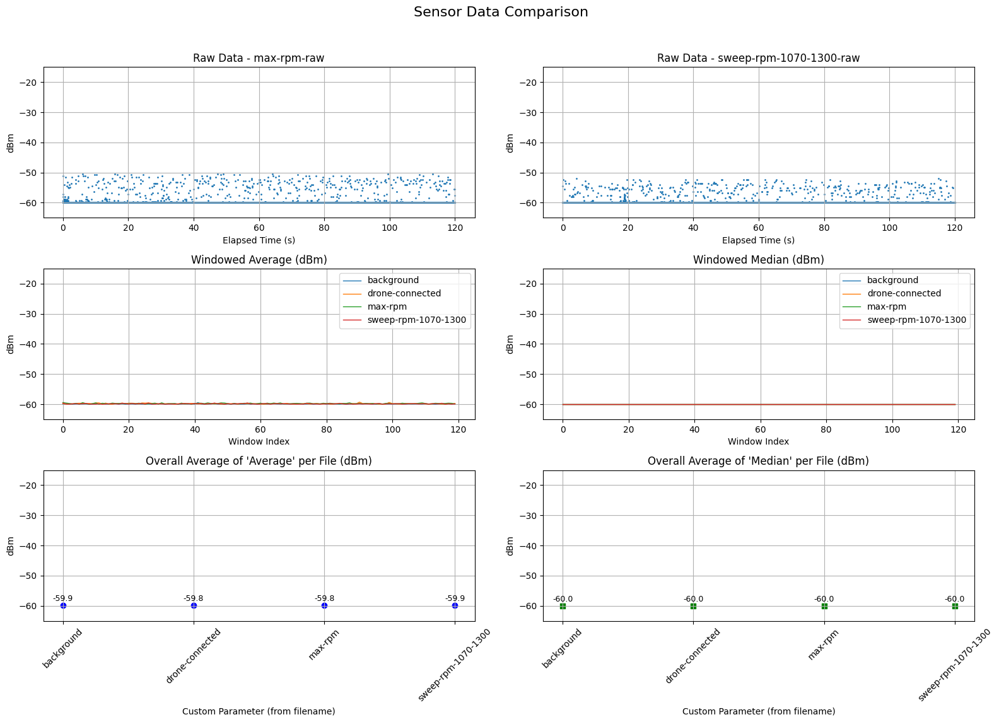

In [5]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-34-12_max-rpm-raw.csv",
    "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv",
    "processed-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300.csv"
]
make_plot(raw_files,processed_files)



Propeller vibration analysis: Conducting a PWM sweep from 1070 to 1300 (right before hover) to analyze
potential vibration effects. As seen in the raw plots there is no difference betweeen drone powered scenraio and the this scenario. We also see that the signal is stationary, showing that event at 1300PWM there is no influence of the propellors on the mesured value. Simlarly the average and Mdian values are around -60 dbm concluding that this is also has no influence on the measurements.

RC connection

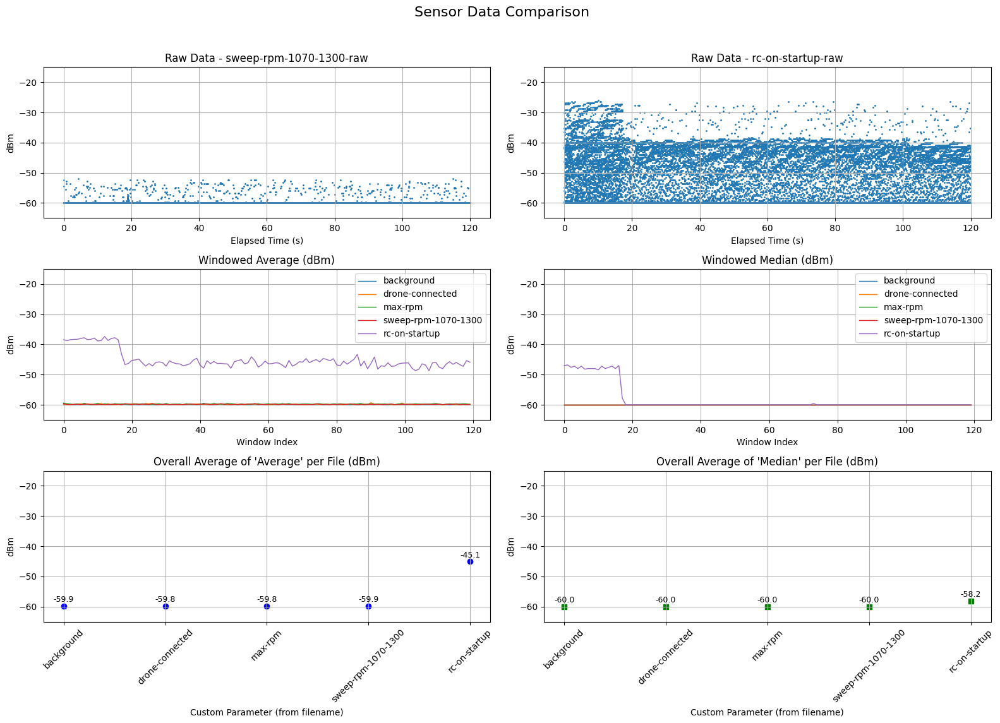

In [6]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv",
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv",
    "processed-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv"
]
make_plot(raw_files,processed_files)


With the rc we can observe a startup effect. The duration of this statup effect is around 20 seconds as seen in the fig below showing 3 independent measurments. After the startup effect the Average is around -45 dbm and the median is -60 dbm. When using the median we can successfully suppress the effect of the rc controller. however, when using the average this rc effect can not be ignored.

this startup effect was measured 3 times

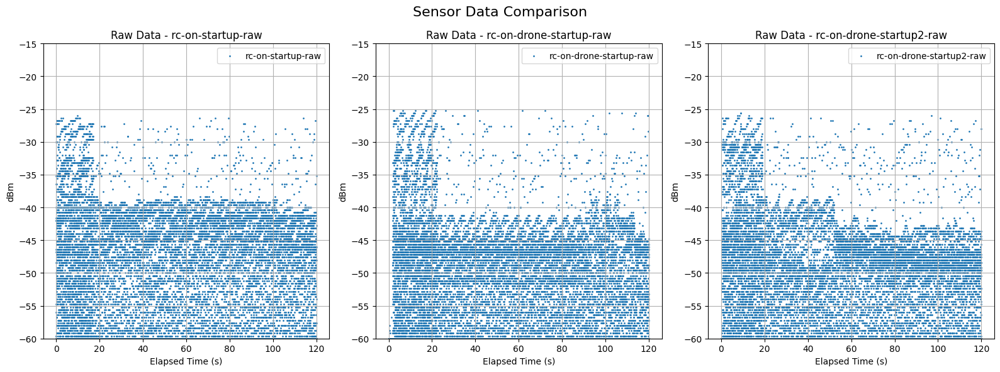

In [7]:

raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    "raw-data\\2025-03-05_18-46-40_rc-on-drone-startup2-raw.csv",
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1) # s=1 for small points
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

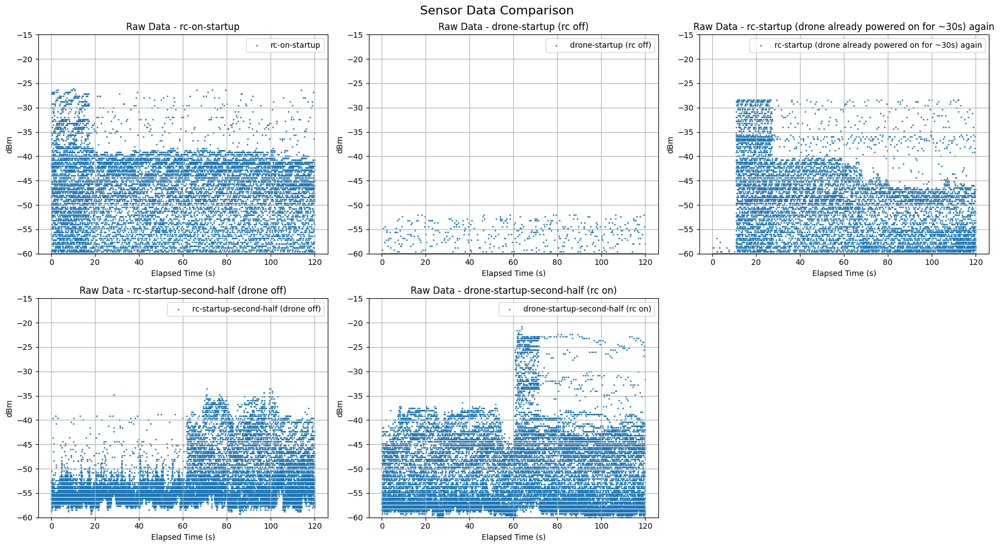

In [8]:
raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    "raw-data\\2025-03-05_18-42-32_drone-connected-startup-raw.csv",
    # "raw-data\\2025-03-05_18-13-10_rc-on-controller-startup-raw.csv",
    "raw-data\\2025-03-31_13-41-28_rc-startup-drone-already-powered-raw.csv",
    "raw-data\\2025-03-05_18-47-01_drone-off-rc-on-second-half-raw.csv",
    "raw-data\\2025-03-05_19-02-28_rc-on-drone-on-second-half-raw.csv"
]

labels=["rc-on-startup",
        "drone-startup (rc off)",
        # "rc-startup (drone already powered on for ~30s)",
        "rc-startup (drone already powered on for ~30s) again",
        "rc-startup-second-half (drone off)",
        "drone-startup-second-half (rc on)"
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


to further investigate the cause of this startup effect and when This specifically occurs and also the qparse piques above -40 dbm, different experiments were conducted were conducted. In the previous scenario the drone and rc were powered on simultaneously right before starting the measurments. To distinguish weather this comes from the drone or from the controller, or from the interaction between them.

the experiments contained only drone, only rc, drone powered before rc is powered and rc powered before drone is powered.


First a measurement was conducted right after the drone startup while the rc is powered off so the drone only scenario. As can be seen in figure X this startup effect does not happen at the startup of the drone. And the measured signal is similar to the background noise as discussed in the previous section.

The rc only scenario can be seen in figure X, here we can also observe no startup behavior.

Then a measurement was conducted with the drone already powered on for ~30s and the rc powered on 10 seconds after starting measurements. The raw data is shown in figure X and a startup behaviour can be observed, amso we can observe the piques.

next, a scenario was measured where the rc was powered on and the drone was powered on after 60 seconds. Here The startup behaviour is very visible and also the piques

concluding that this startup effect is a sort of handshake protocol we can observe in the signal. The piques only apprear in situations when the drone and rc are both powered and lead to a conclusion that thos happen because of communication. Now to reduce the influence of the RC We already observed that it has an effect on the average but not on the median. As an extra experiment measurements were conducted with the rc controller as far as possible but still connected to the receiver trying a real life scenario. 

extra experiment see when startup happens every time rc connects or only first power cycle?


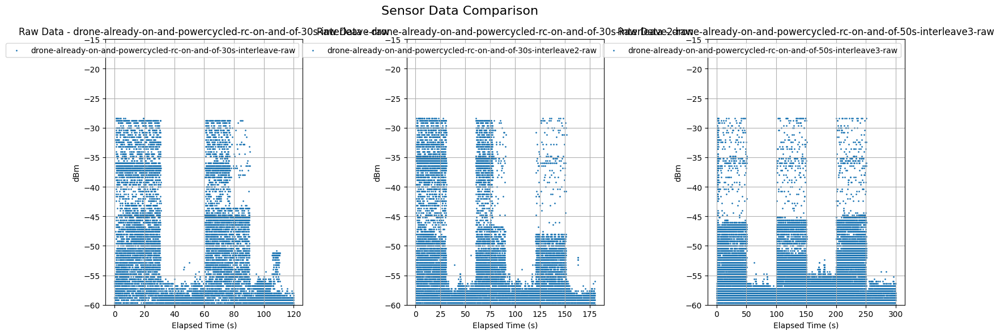

In [9]:

raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    "raw-data\\2025-03-31_13-57-07_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave-raw.csv",
    "raw-data\\2025-03-31_14-02-15_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave2-raw.csv",
    "raw-data\\2025-03-31_14-08-41_drone-already-on-and-powercycled-rc-on-and-of-50s-interleave3-raw.csv"
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

not really consistent, extra experiment, sig visible on controller

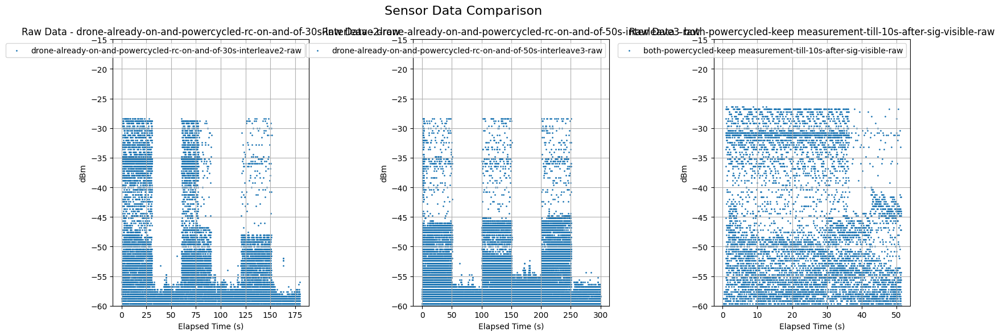

In [10]:

raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    # "raw-data\\2025-03-31_13-57-07_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave-raw.csv",
    "raw-data\\2025-03-31_14-02-15_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave2-raw.csv",
    "raw-data\\2025-03-31_14-08-41_drone-already-on-and-powercycled-rc-on-and-of-50s-interleave3-raw.csv",
    "raw-data\\2025-03-31_14-16-18_both-powercycled-keep measurement-till-10s-after-sig-visible-raw.csv"
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

the handshake is not a real handshake but a signal that is visible while the rc and drone are measurin signal quality, thm oment sig is visible this startup signal disappears.

A new question also arised what if you send signal with your controller. To conduct this experiment was conducted where the first 60 seconds the controller did not send any data. Then after 60 seconds, the throttle was raised gradually from 0 to max constantly sending out higher throttle values.

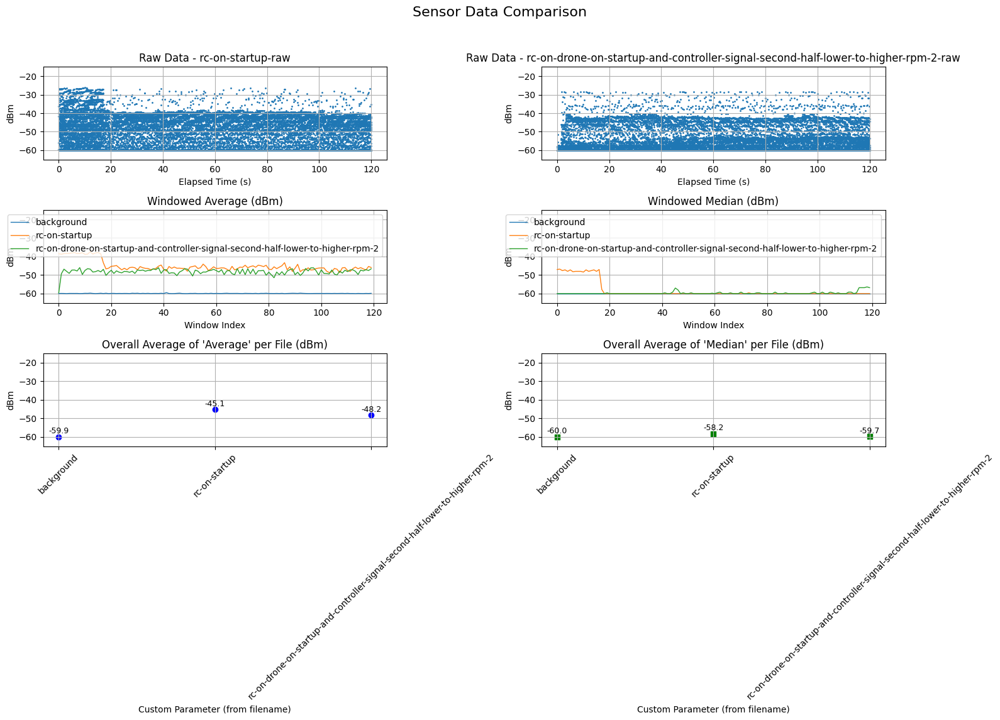

In [11]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    "raw-data\\2025-03-31_13-51-10_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-2-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    # "processed-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm.csv",
    "processed-data\\2025-03-31_13-51-10_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-2.csv"

]
make_plot(raw_files,processed_files)



todo redo this in kelder because mediaan is hoog done

As shown in Figure X the signal is stationary and no effect of the throttle or rc sending thrittle values can be observed.

now see if we can see any difference in signal between 3m and far away

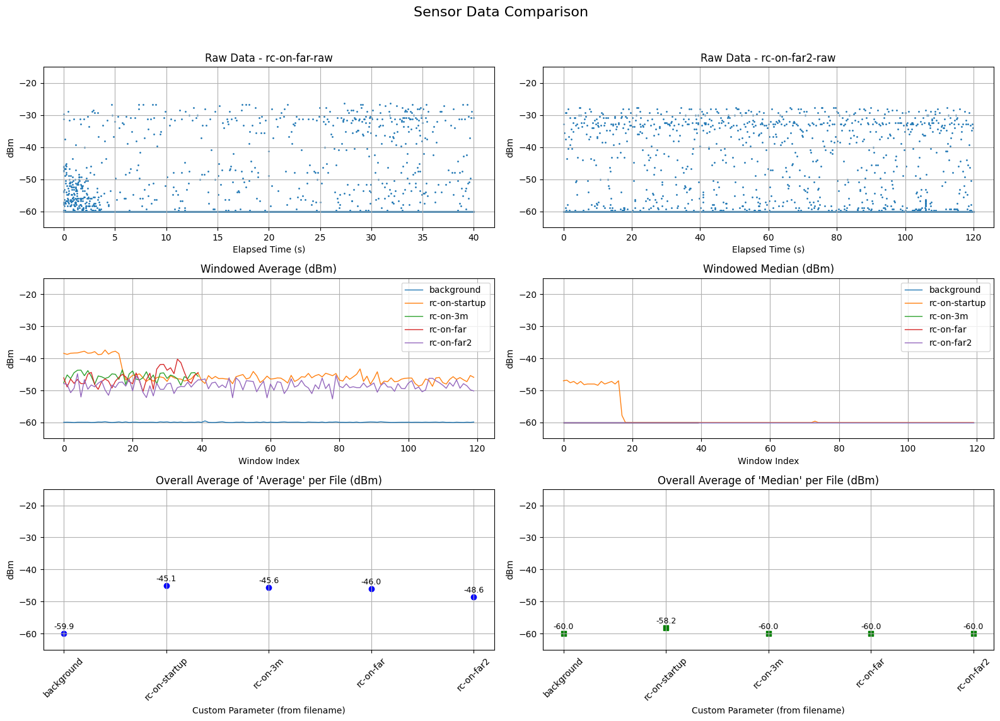

In [12]:

# Raw data files
raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    # "raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv",
    "raw-data\\2025-03-31_14-51-44_rc-on-far-raw.csv",
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    "processed-data\\2025-03-31_14-50-59_rc-on-3m.csv",
    "processed-data\\2025-03-31_14-51-44_rc-on-far.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv"
]
make_plot(raw_files,processed_files)



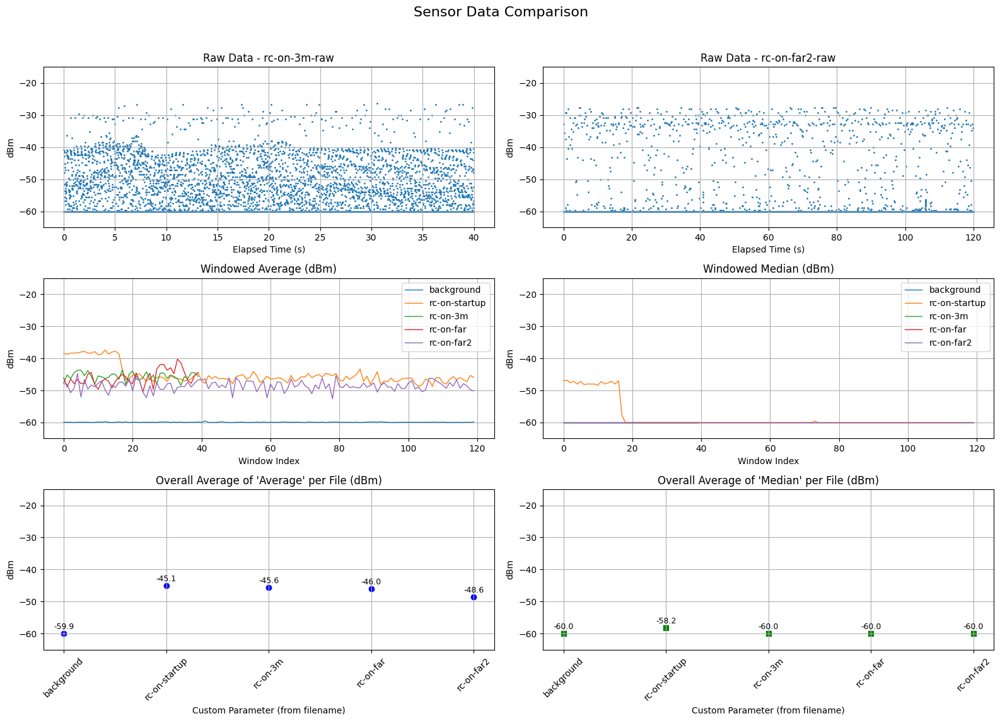

In [13]:

# Raw data files
raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    "raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv",
    # "raw-data\\2025-03-31_14-51-44_rc-on-far-raw.csv",
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    "processed-data\\2025-03-31_14-50-59_rc-on-3m.csv",
    "processed-data\\2025-03-31_14-51-44_rc-on-far.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv"
]
make_plot(raw_files,processed_files)



conclusie hier is dat afstand van rc niet echt boeit voor average zolang singaal boven 5 is.


telemetry

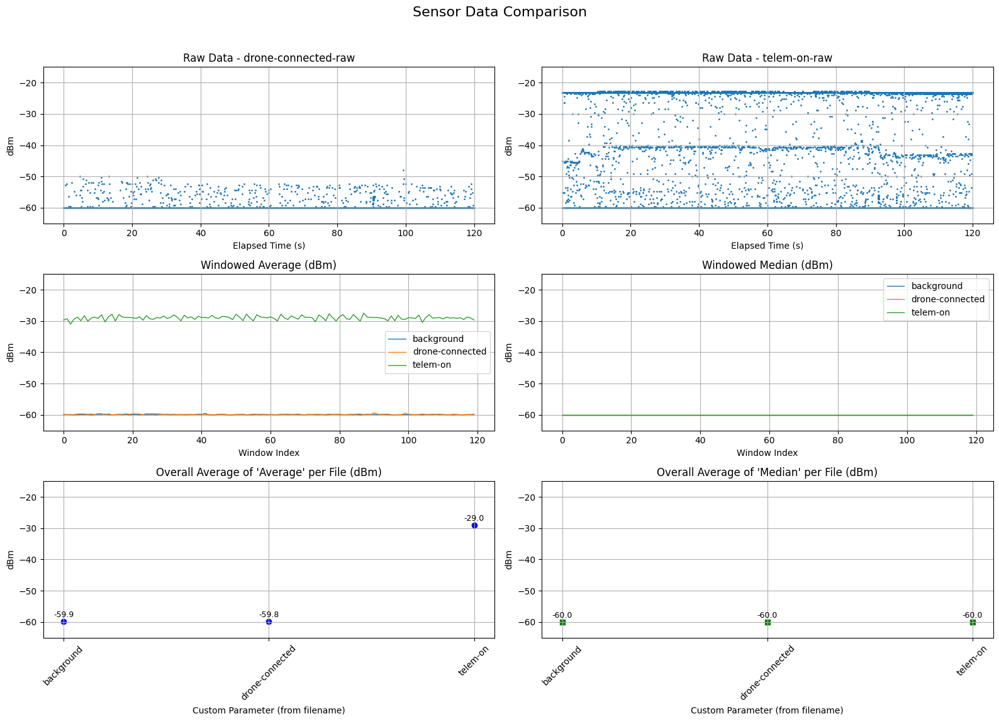

In [14]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv"
]
make_plot(raw_files,processed_files)



Looking at the raw data 2 lines can be observed, one at -40 dbm, one at -24dbm.
It is also shown that the telemetry has no influence on the Median but it does affect the average.

different experiments to see if the effect of the telemetry radio could be reduced.
first an experiment where telemtry radio is connected to the drone, then later the other telemetry radio is connected to the laptop, and finally a connection is made with the ground control station. We can observe that the line at -40 dbm only appears once the second tememetry radio is connected. Explicitly connecting to MP does not have an effect on the received average signal.


the second experiment there is no telemetry radio connected to the drone. here we can observe that only the smaller line is visible affirming that this line at -40dbm appears because of the other telemetry radio plugged in on the laptop.
So an third experiment was conducted with the second telemtry radio but at a distance of 3 m
Here we can see a decrease of telemetry signal received by the broadand probe.

To see what the effect would be in a realistic scenario where the drone pilot would be far away a measurement was conducted with only the drone telemetry radio. Here it was observed that the 2nd line was gone, confirming our hypthesis. However, when looking at the average singal values if was similar to the first experiment where the other line was measured at -40dbm.

Concluding that telemtry does affect the measured average but not the median. Even when neglecting the effect of the second telemetry radio has no effect on the measured average values. However, the median is not affected.

todo look at 1 second and conclude why telemetry has no effect on median, do similar for rc


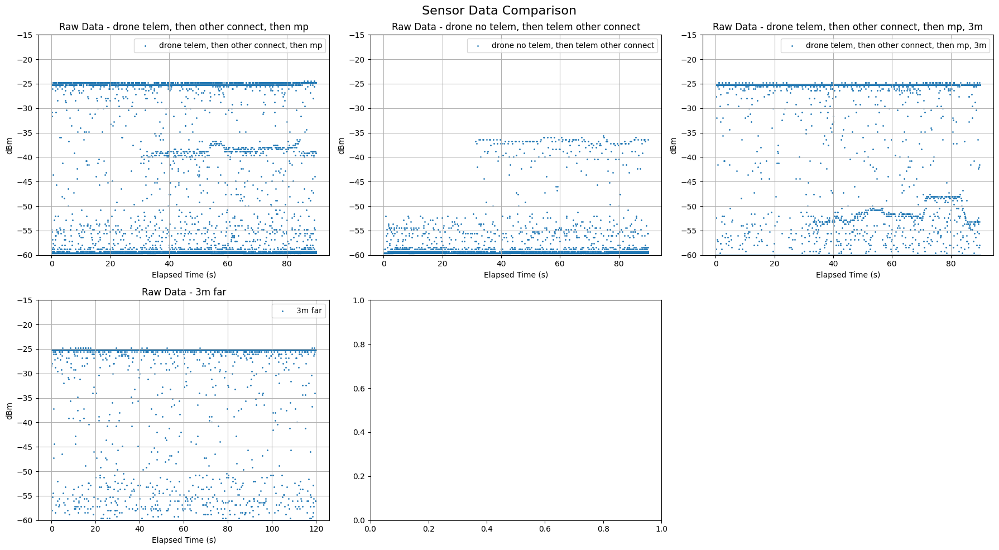

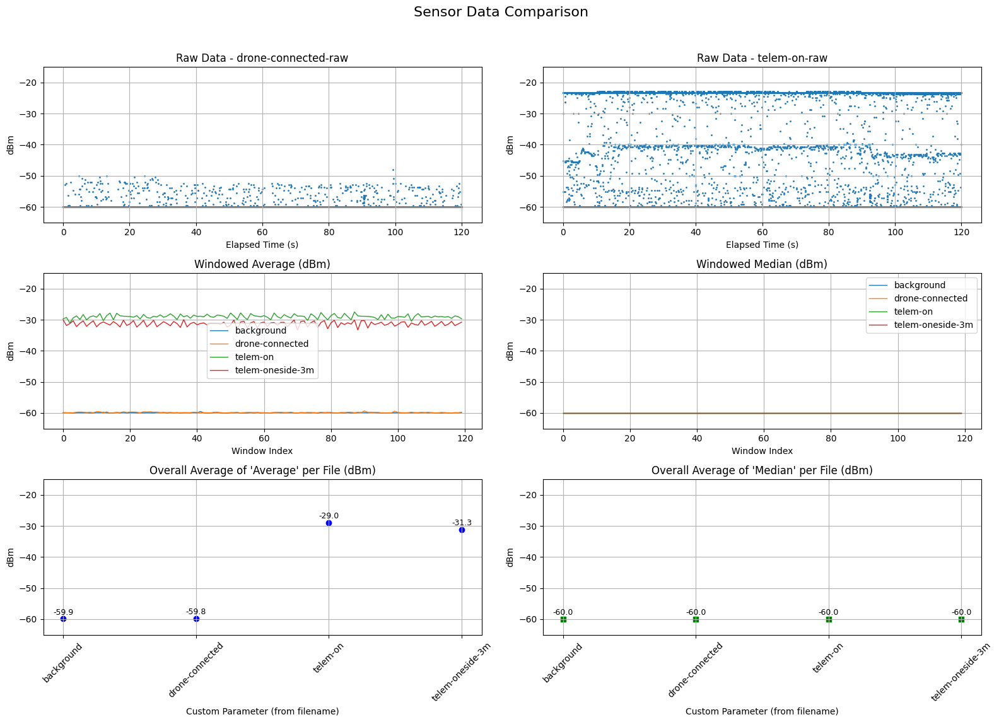

In [15]:
raw_files = [
    "raw-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-29_16-44-05_telem-oneside-then-connect-laptop-finally-connect-mp-3m-raw.csv",
    "raw-data\\2025-03-29_16-58-00_telem-oneside-3m-raw.csv"
]

labels=["drone telem, then other connect, then mp",
        "drone no telem, then telem other connect",
        "drone telem, then other connect, then mp, 3m",
        "3m far",
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv",
    # "processed-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-44-05_telem-oneside-then-connect-laptop-finally-connect-mp-3m.csv",
    "processed-data\\2025-03-29_16-58-00_telem-oneside-3m.csv"
]
make_plot(raw_files,processed_files)

telem orientatie

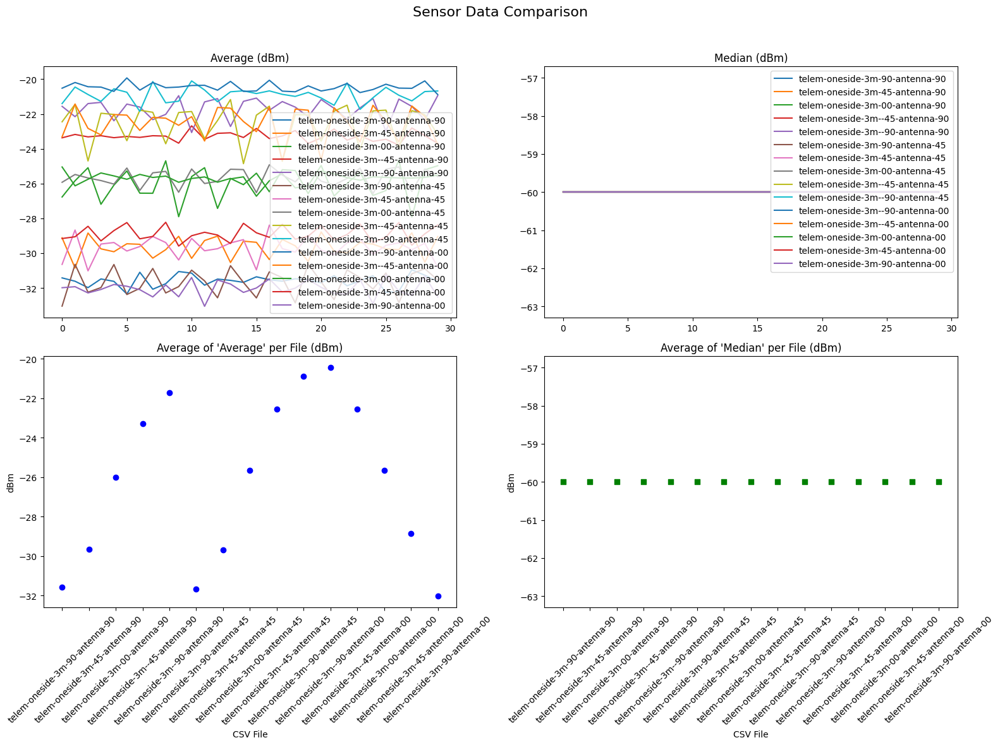

In [16]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    "processed-data\\2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45.csv",
    "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    "processed-data\\2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45.csv",
    "processed-data\\2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45.csv",
    "processed-data\\2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45.csv",
    "processed-data\\2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00.csv",
    "processed-data\\2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00.csv",
    "processed-data\\2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00.csv",
    "processed-data\\2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00.csv",
    "processed-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-32-05_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_12-33-10_telem-oneside-3m-45-antenna--45.csv",
    # "processed-data\\2025-03-31_12-37-43_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-42-38_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-45-12_telem-oneside-3m-45-antenna-00.csv"
    # "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv"
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
axes[1, 0].set_title("Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("CSV File")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



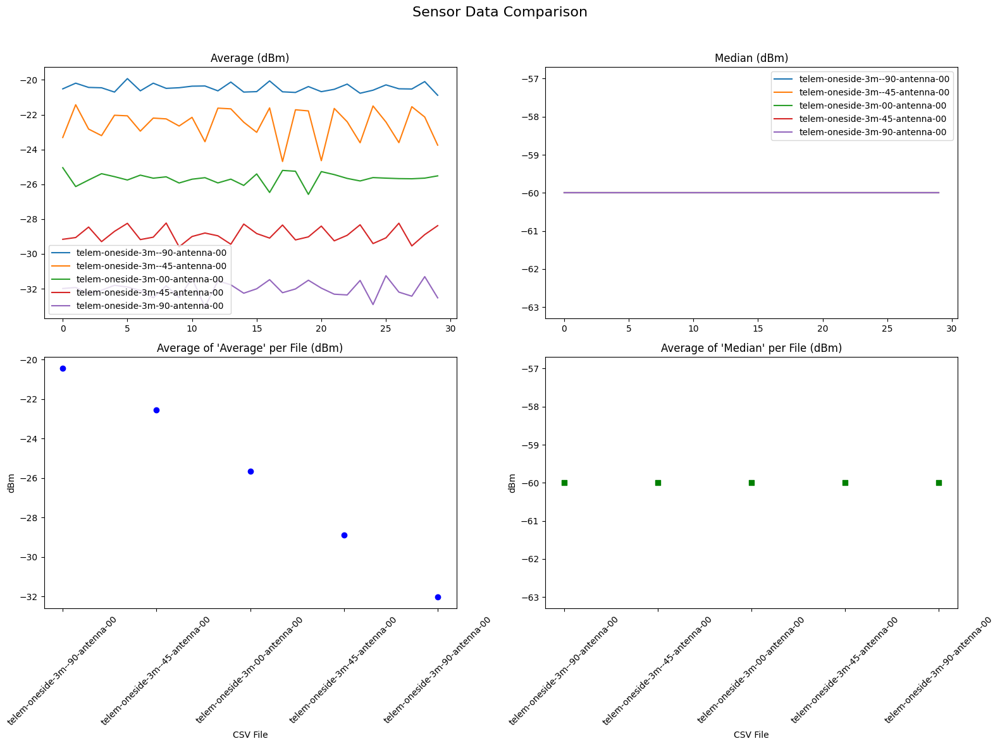

In [17]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    # "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    # "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    # "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45.csv",
    # "processed-data\\2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45.csv",
    # "processed-data\\2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45.csv",
    "processed-data\\2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00.csv",
    "processed-data\\2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00.csv",
    "processed-data\\2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00.csv",
    "processed-data\\2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00.csv",
    "processed-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-32-05_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_12-33-10_telem-oneside-3m-45-antenna--45.csv",
    # "processed-data\\2025-03-31_12-37-43_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-42-38_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-45-12_telem-oneside-3m-45-antenna-00.csv"
    # "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv"
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
axes[1, 0].set_title("Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("CSV File")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



To try an reduce the impact of the telemetry, different orientations were tested 90, 45 0 -45 and -90 and for each telemetry orientation 3 sensor orientations were tested, 90 45 00. 
We can observe that the orientation of the sensor doesn't really matter that much but the orientation of the telemetry antenna has the greatest impact on the measured signal. The telemetry has least effect when the antenna is 90degrees up and the sensor is flat. conclusion by flying with the correct orientation of the radios, the measured interference can be reduced by 12 dbm. 8x times reduction.

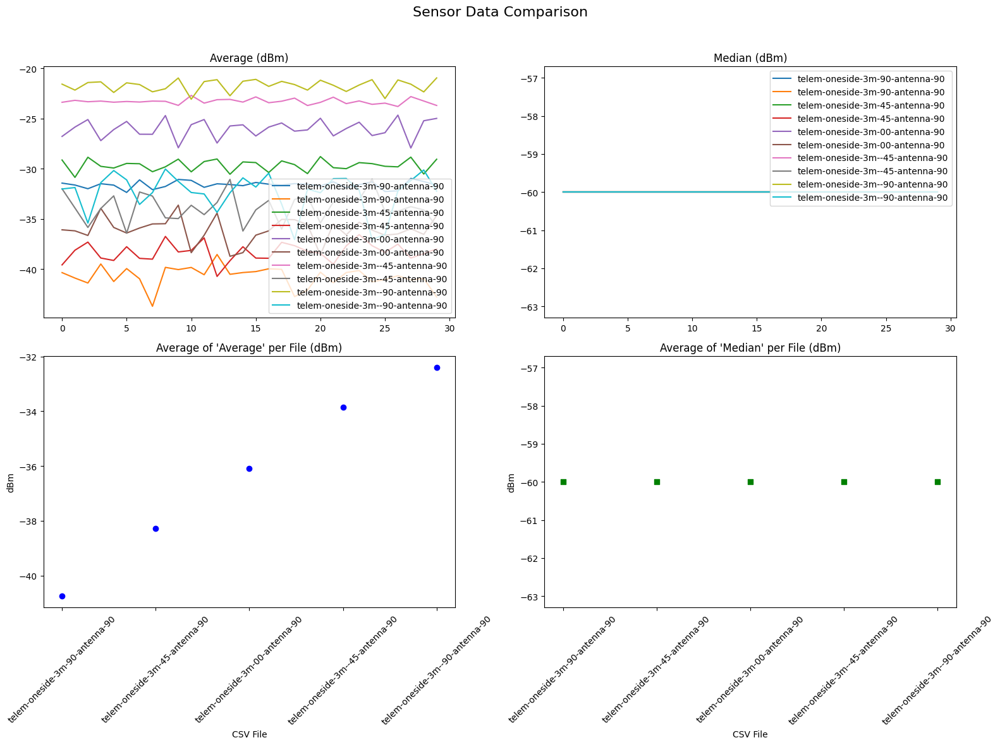

In [18]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    "processed-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90.csv",
    # "processed-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90.csv",
    # "processed-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90.csv",
    # "processed-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-57-45_telem-oneside-3m-90-antenna-45.csv",
    # "processed-data\\2025-03-31_12-58-30_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-59-10_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90.csv",
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
axes[1, 0].set_title("Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("CSV File")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



redoing experiments changes absolute measured values but relative values stay the same

In [19]:
average_dbm_per_file

{'telem-oneside-3m-90-antenna-90': np.float64(-40.748803919749086),
 'telem-oneside-3m-45-antenna-90': np.float64(-38.2788338255229),
 'telem-oneside-3m-00-antenna-90': np.float64(-36.09404214116727),
 'telem-oneside-3m--45-antenna-90': np.float64(-33.851063000811365),
 'telem-oneside-3m--90-antenna-90': np.float64(-32.4070171315922)}

telem orientation final


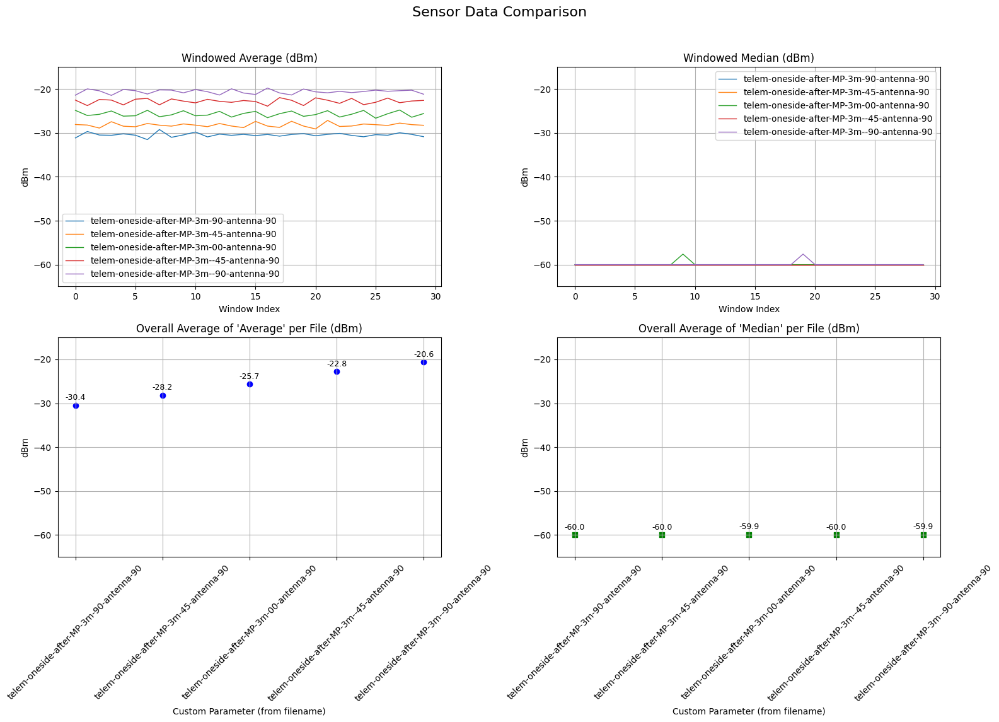

In [20]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    "processed-data\\2025-04-01_17-32-53_telem-oneside-after-MP-3m-45-antenna-90.csv",
    "processed-data\\2025-04-01_17-35-02_telem-oneside-after-MP-3m-00-antenna-90.csv",
    "processed-data\\2025-04-01_17-36-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
    "processed-data\\2025-04-01_17-37-13_telem-oneside-after-MP-3m--90-antenna-90.csv",
    # "processed-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-39-41_telem-oneside-after-MP-3m-00-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m--45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-48-07_telem-oneside-after-MP-3m--90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-49-10_telem-oneside-after-MP-3m-90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-16_telem-oneside-after-MP-3m-45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-56_telem-oneside-after-MP-3m-00-antenna-00.csv",
    # "processed-data\\2025-04-01_17-51-50_telem-oneside-after-MP-3m--45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-52-46_telem-oneside-after-MP-3m--90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-53-50_telem-oneside-after-MP-3m-90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-54-59_telem-oneside-after-MP-3m-45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-55-44_telem-oneside-after-MP-3m-00-antenna--45.csv",
    # "processed-data\\2025-04-01_17-56-34_telem-oneside-after-MP-3m--45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-57-18_telem-oneside-after-MP-3m--90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    # "processed-data\\2025-04-01_17-59-19_telem-oneside-after-MP-3m-45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-00-15_telem-oneside-after-MP-3m-00-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-10_telem-oneside-after-MP-3m--45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-53_telem-oneside-after-MP-3m--45-antenna--90.csv",
]

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
fig.suptitle("Sensor Data Comparison", fontsize=16)

# --- Process and plot processed data ---
if not processed_files:
    print("Warning: No processed files provided.")
    # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
    for j in range(2):
        axes[1, j].set_visible(False)
        axes[2, j].set_visible(False)

for file in processed_files:
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")

        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Window Index") # Or Time if applicable
axes[0, 1].set_xlabel("Window Index") # Or Time if applicable
axes[0, 0].set_ylabel("dBm")
axes[0, 1].set_ylabel("dBm")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()


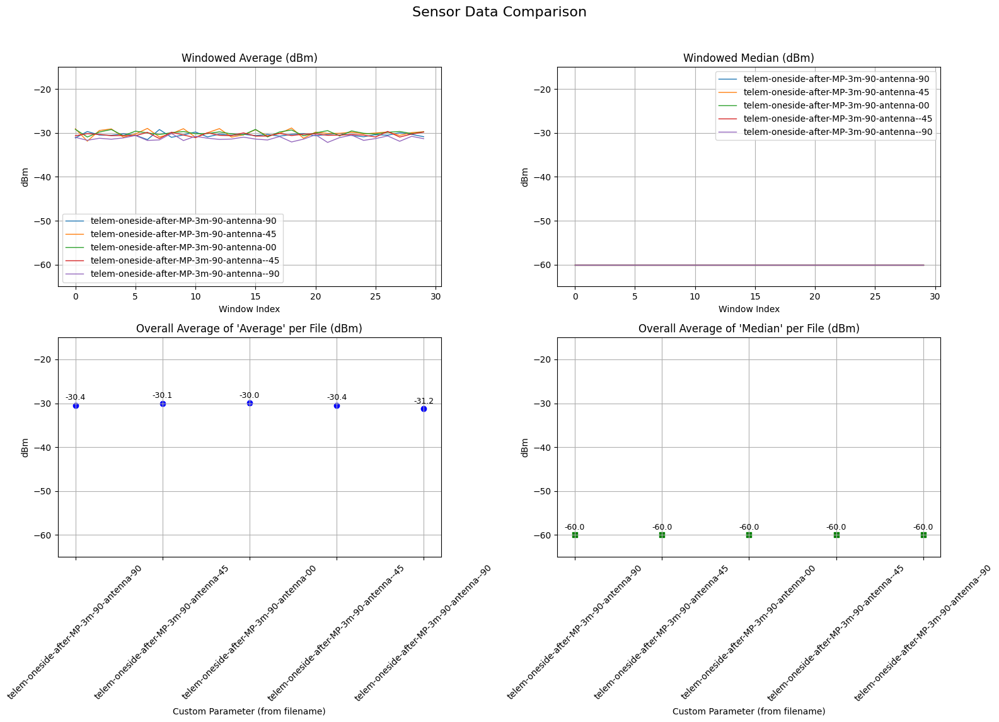

In [21]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-04-01_17-32-53_telem-oneside-after-MP-3m-45-antenna-90.csv",
    # "processed-data\\2025-04-01_17-35-02_telem-oneside-after-MP-3m-00-antenna-90.csv",
    # "processed-data\\2025-04-01_17-36-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
    # "processed-data\\2025-04-01_17-37-13_telem-oneside-after-MP-3m--90-antenna-90.csv",
    "processed-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-39-41_telem-oneside-after-MP-3m-00-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m--45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-48-07_telem-oneside-after-MP-3m--90-antenna-45.csv",
    "processed-data\\2025-04-01_17-49-10_telem-oneside-after-MP-3m-90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-16_telem-oneside-after-MP-3m-45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-56_telem-oneside-after-MP-3m-00-antenna-00.csv",
    # "processed-data\\2025-04-01_17-51-50_telem-oneside-after-MP-3m--45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-52-46_telem-oneside-after-MP-3m--90-antenna-00.csv",
    "processed-data\\2025-04-01_17-53-50_telem-oneside-after-MP-3m-90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-54-59_telem-oneside-after-MP-3m-45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-55-44_telem-oneside-after-MP-3m-00-antenna--45.csv",
    # "processed-data\\2025-04-01_17-56-34_telem-oneside-after-MP-3m--45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-57-18_telem-oneside-after-MP-3m--90-antenna--45.csv",
    "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    # "processed-data\\2025-04-01_17-59-19_telem-oneside-after-MP-3m-45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-00-15_telem-oneside-after-MP-3m-00-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-10_telem-oneside-after-MP-3m--45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-53_telem-oneside-after-MP-3m--45-antenna--90.csv",
]

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
fig.suptitle("Sensor Data Comparison", fontsize=16)

# --- Process and plot processed data ---
if not processed_files:
    print("Warning: No processed files provided.")
    # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
    for j in range(2):
        axes[1, j].set_visible(False)
        axes[2, j].set_visible(False)

for file in processed_files:
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")

        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Window Index") # Or Time if applicable
axes[0, 1].set_xlabel("Window Index") # Or Time if applicable
axes[0, 0].set_ylabel("dBm")
axes[0, 1].set_ylabel("dBm")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(0,2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()


noisy look at zoomed data

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\3285800757.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


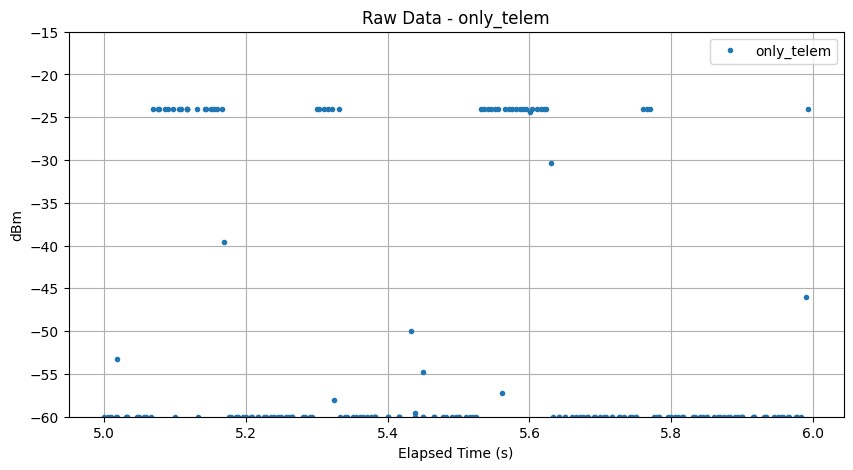

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\3285800757.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


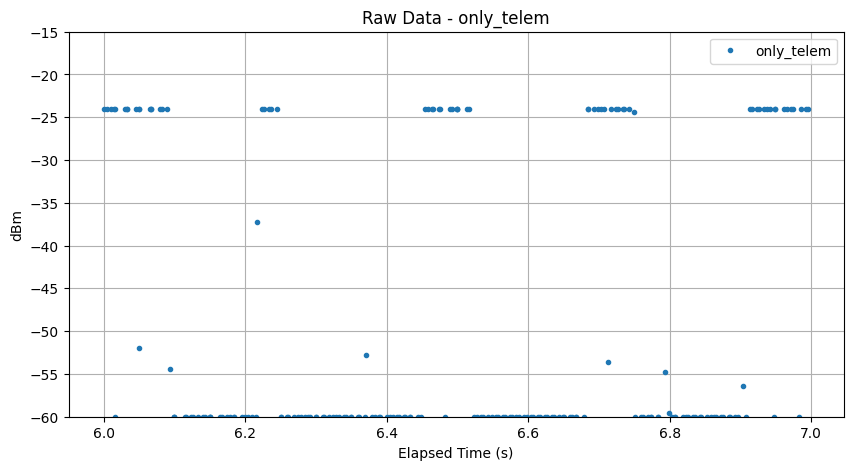

In [22]:

df = pd.read_csv("raw-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")

# Select only data where "Second" == 90
for i in range(5,7):
    df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
    plt.title(f"Raw Data - {"only_telem"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, -15)  
    plt.grid(True)
    plt.legend()


    plt.show()


nieut echt vaste periode?
probeer eens periode te vinden

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\4089418235.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


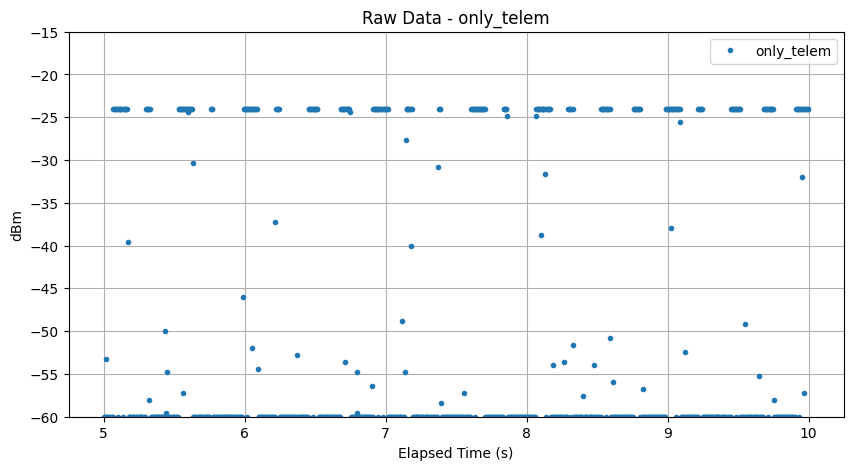

In [23]:

df = pd.read_csv("raw-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 5) & (df["Elapsed Time (s)"] < 10)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
plt.title(f"Raw Data - {"only_telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


try to find freq

Found 1497 points above -25.0 dBm.
Grouped into 132 distinct burst events.


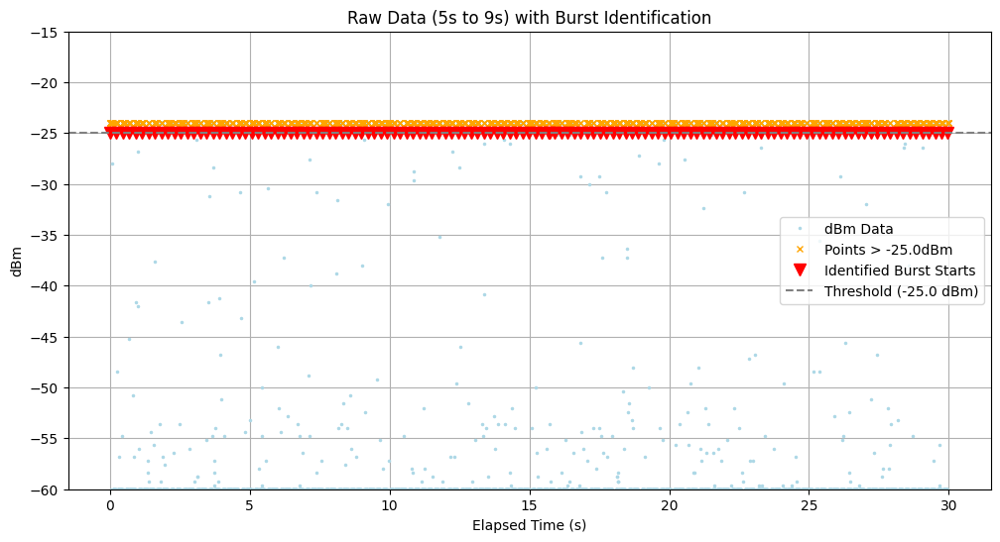


Analyzing 131 intervals between distinct bursts...

--- Inter-Burst Interval Statistics (between burst starts) ---
Mean:   0.2288 s
Median: 0.2300 s
Std Dev:0.0168 s
Min:    0.0490 s
Max:    0.2410 s


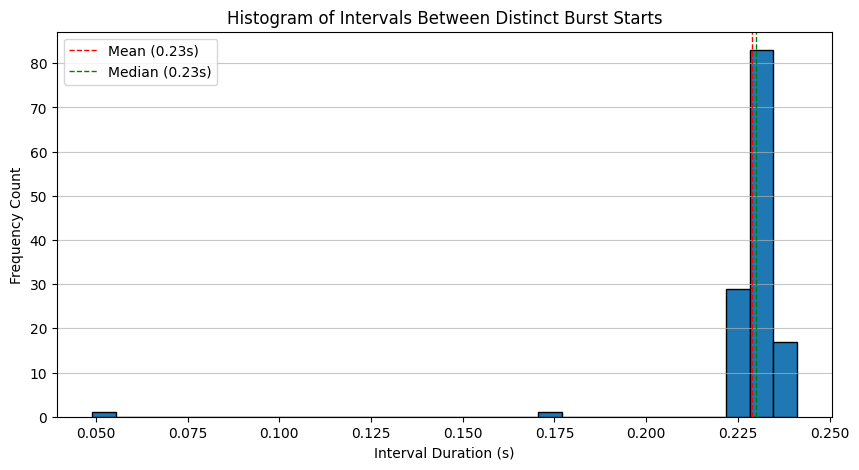


--- Lomb-Scargle Periodogram (using Burst Start Times) ---
Peak detected at Frequency: 4.3361 Hz
Corresponding Period:     0.2306 s


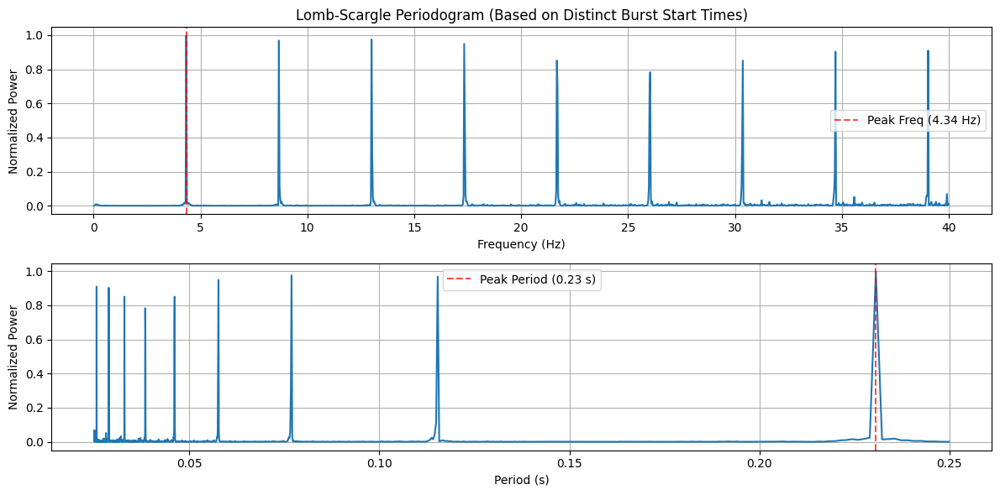

In [24]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lombscargle

# --- Your existing code ---
def voltage_to_dbm(voltage):
    # (Same function as before)
    if voltage > 2.0:
        voltage = 2.0
    elif voltage < 0.5:
        voltage = 0.5
    return (voltage / -0.025) + 20.0

# Load data
try:
    df = pd.read_csv("raw-data/2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")
except FileNotFoundError:
    print("Error: CSV file not found. Please check the path.")
    exit()
    
if not {"Elapsed Time (s)", "Value"}.issubset(df.columns):
    print("Error: Required columns 'Elapsed Time (s)' or 'Value' not found in CSV.")
    exit()

# Select the time window
start_time = 5
end_time = 9
df_filtered = df#[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()

# Calculate dBm
df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# --- Frequency Analysis ---

threshold_dbm = -25.0
min_inter_sample_gap = 0.025 # Minimum time gap to consider points part of the same burst

# 1. Identify *all* points above threshold
burst_points = df_filtered[df_filtered["dBm"] > threshold_dbm]
all_burst_times = burst_points["Elapsed Time (s)"].values # Get as numpy array

if len(all_burst_times) == 0:
    print(f"No points found above {threshold_dbm} dBm in the time window.")
    exit()

# 2. Identify DISTINCT Burst Event Start Times
burst_start_times = []
if len(all_burst_times) > 0:
    burst_start_times.append(all_burst_times[0]) # The first point always starts a burst
    # Check subsequent points
    for i in range(1, len(all_burst_times)):
        # If the gap to the previous point is LARGER than the threshold, it's a new burst
        if (all_burst_times[i] - all_burst_times[i-1]) > min_inter_sample_gap + 1e-9: # Add small epsilon for float comparison
            burst_start_times.append(all_burst_times[i])

burst_start_times = np.array(burst_start_times) # Convert to numpy array

print(f"Found {len(all_burst_times)} points above {threshold_dbm} dBm.")
print(f"Grouped into {len(burst_start_times)} distinct burst events.")


# --- Plot Data with Identified Burst Starts ---
plt.figure(figsize=(12, 6))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="dBm Data", color='lightblue', markersize=3)
plt.plot(burst_points["Elapsed Time (s)"], burst_points["dBm"], "x", color='orange', markersize=5, label=f'Points > {threshold_dbm}dBm')
plt.plot(burst_start_times, np.full(burst_start_times.shape, threshold_dbm), 'rv', markersize=8, label='Identified Burst Starts') # Plot starts near threshold
plt.axhline(threshold_dbm, color='grey', linestyle='--', label=f'Threshold ({threshold_dbm} dBm)')
plt.title(f"Raw Data ({start_time}s to {end_time}s) with Burst Identification")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)
plt.grid(True)
plt.legend()
plt.show()


# --- Proceed with analysis ONLY if we have multiple distinct bursts ---
if len(burst_start_times) < 2:
    print(f"Not enough distinct burst events ({len(burst_start_times)}) identified to analyze frequency.")
else:
    # 3. Calculate Inter-Burst Intervals (time difference between START of bursts)
    inter_burst_intervals = np.diff(burst_start_times)

    print(f"\nAnalyzing {len(inter_burst_intervals)} intervals between distinct bursts...")

    # 4. Analyze Intervals (Statistics and Histogram) - Now reflects time BETWEEN bursts
    mean_interval = np.mean(inter_burst_intervals)
    median_interval = np.median(inter_burst_intervals)
    std_interval = np.std(inter_burst_intervals)
    min_interval = np.min(inter_burst_intervals)
    max_interval = np.max(inter_burst_intervals)

    print("\n--- Inter-Burst Interval Statistics (between burst starts) ---")
    print(f"Mean:   {mean_interval:.4f} s")
    print(f"Median: {median_interval:.4f} s")
    print(f"Std Dev:{std_interval:.4f} s")
    print(f"Min:    {min_interval:.4f} s")
    print(f"Max:    {max_interval:.4f} s")

    plt.figure(figsize=(10, 5))
    plt.hist(inter_burst_intervals, bins=30, edgecolor='black') # Adjust bins as needed
    plt.title("Histogram of Intervals Between Distinct Burst Starts")
    plt.xlabel("Interval Duration (s)")
    plt.ylabel("Frequency Count")
    plt.axvline(mean_interval, color='r', linestyle='dashed', linewidth=1, label=f'Mean ({mean_interval:.2f}s)')
    plt.axvline(median_interval, color='g', linestyle='dashed', linewidth=1, label=f'Median ({median_interval:.2f}s)')
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()

    # 5. Lomb-Scargle Periodogram - Use burst_start_times!
    print("\n--- Lomb-Scargle Periodogram (using Burst Start Times) ---")
    # Define frequencies to scan
    min_freq = 1 / (burst_start_times[-1] - burst_start_times[0]) if (burst_start_times[-1] - burst_start_times[0]) > 0 else 0.1
    max_freq=1/0.025

    num_freq_points = min(5000, len(burst_start_times)*10) # More points might be needed now
    ang_freqs = np.linspace(2 * np.pi * min_freq, 2 * np.pi * max_freq, num_freq_points)

    # Use the identified burst_start_times as the time input for Lomb-Scargle
    y_values = np.ones_like(burst_start_times) # Still use 1s as we only care about timing
    power = lombscargle(burst_start_times, y_values, ang_freqs, normalize=True)

    frequencies = ang_freqs / (2 * np.pi)
    periods = 1 / frequencies

    peak_index = np.argmax(power)
    peak_freq = frequencies[peak_index]
    peak_period = 1 / peak_freq

    print(f"Peak detected at Frequency: {peak_freq:.4f} Hz")
    print(f"Corresponding Period:     {peak_period:.4f} s")

    # Plot the periodogram
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    plt.plot(frequencies, power)
    plt.title("Lomb-Scargle Periodogram (Based on Distinct Burst Start Times)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Normalized Power")
    plt.axvline(peak_freq, color='r', linestyle='--', alpha=0.7, label=f'Peak Freq ({peak_freq:.2f} Hz)')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 1, 2)
    valid_period_indices = frequencies >4
    plt.plot(periods[valid_period_indices], power[valid_period_indices])
    plt.xlabel("Period (s)")
    plt.ylabel("Normalized Power")
    plt.axvline(peak_period, color='r', linestyle='--', alpha=0.7, label=f'Peak Period ({peak_period:.2f} s)')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

telem affected signal

telemetry and rc combined

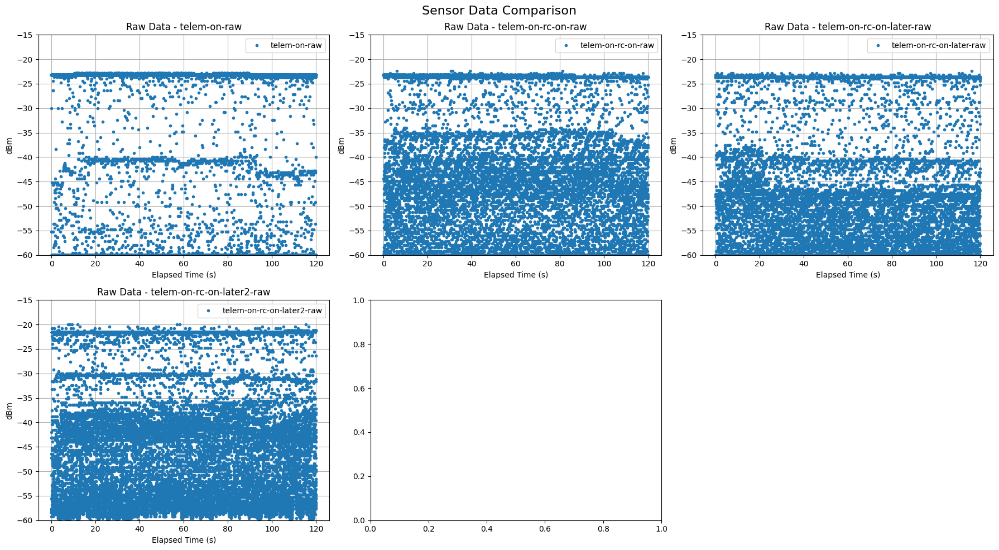

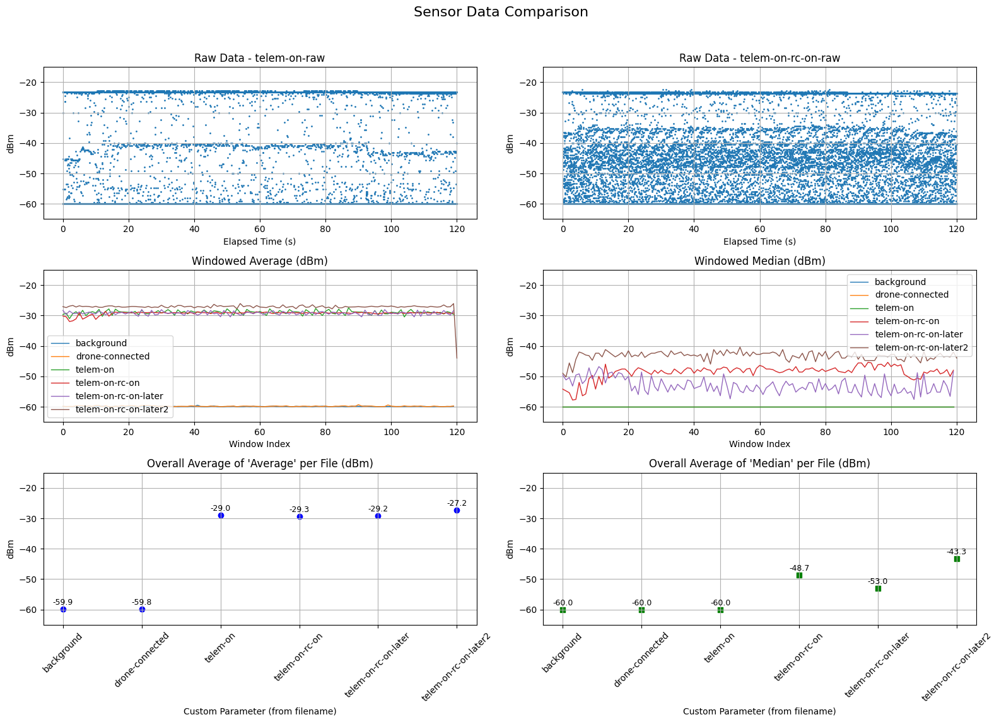

In [25]:
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",
    "raw-data\\2025-03-05_18-37-03_telem-on-rc-on-later-raw.csv",
    "raw-data\\2025-03-05_20-05-42_telem-on-rc-on-later2-raw.csv",
]

# labels=["rc-on-startup",
#         "drone-startup (rc off)",
#         "rc-startup (drone already powered on for ~30s)",
#         "rc-startup-second-half (drone off)",
#         "drone-startup-second-half (rc on)"
#         ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv",
    "processed-data\\2025-03-05_17-38-19_telem-on-rc-on.csv",
    "processed-data\\2025-03-05_18-37-03_telem-on-rc-on-later.csv",
    "processed-data\\2025-03-05_20-05-42_telem-on-rc-on-later2.csv",
]
make_plot(raw_files,processed_files)



When looking at the combination of telemetry with rc these experiments have to be redone, taking the next experiment into account.



redo


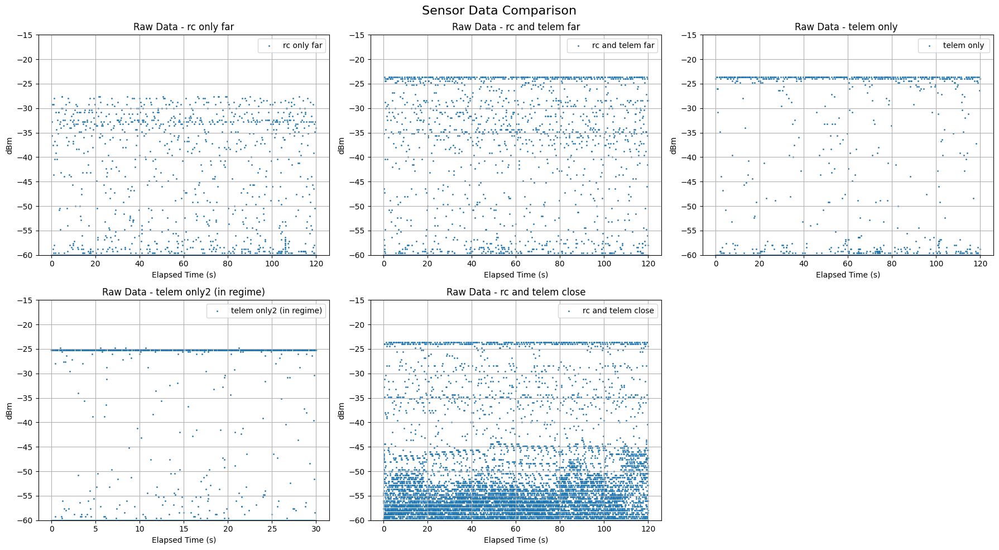

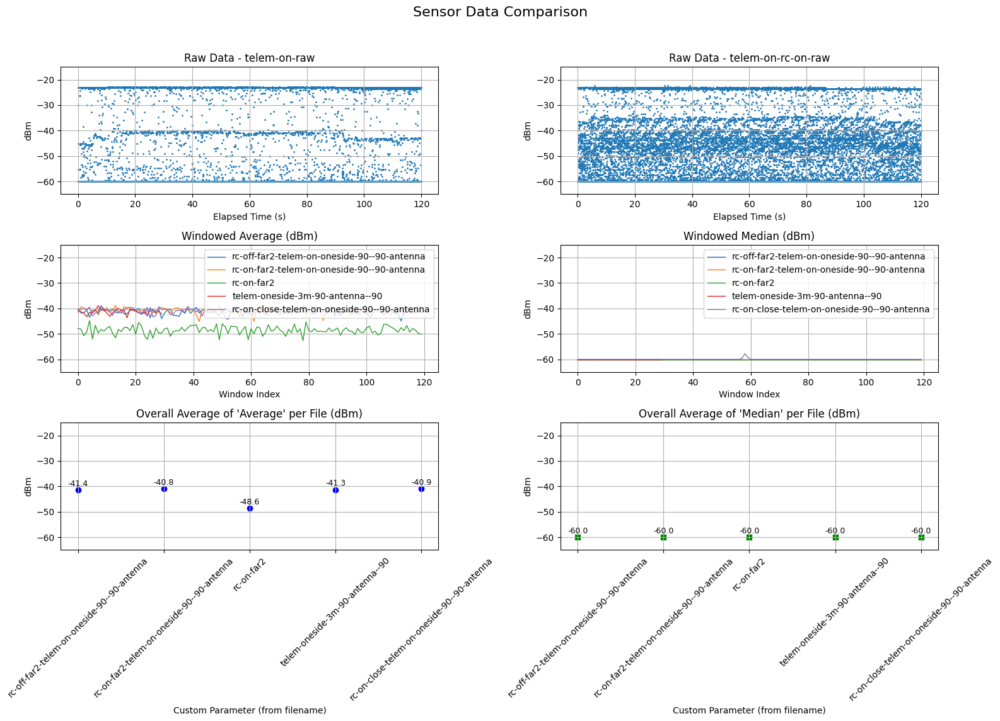

In [26]:
raw_files = [
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv",
    "raw-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna-raw.csv",
    "raw-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna-raw.csv",
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna-raw.csv"
]

labels=["rc only far",
        "rc and telem far",
        "telem only ",
        "telem only2 (in regime)",
        "rc and telem close",
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"],  label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna.csv",
    "processed-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv",
    "processed-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90.csv",
    "processed-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna.csv"

]
make_plot(raw_files,processed_files)



if telemetry and rc are both turned on, rc has no influence on the measured average.
median is not influenced by rc and telemetry
so in practice fly after signal strength is visible on controller. rc will have no efect on average if telemetry is on. 
both rc and telemetry will have no effect on median.
redo with telem in regime?


check median

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\2827675293.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


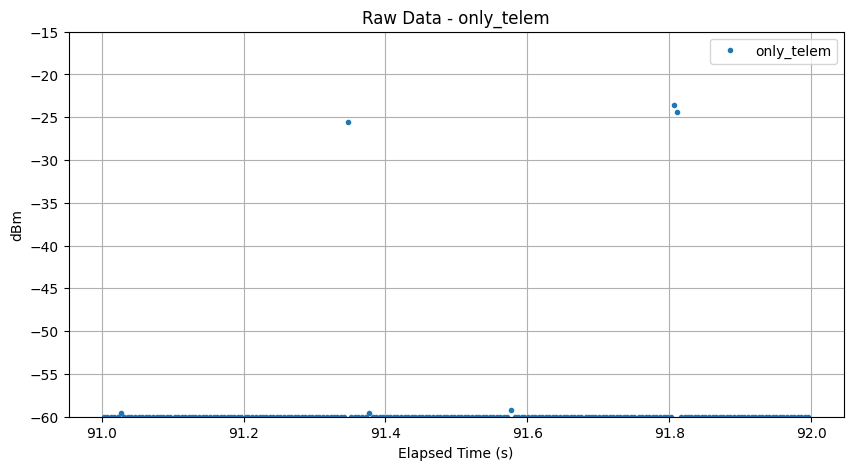

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
df = pd.read_csv("raw-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 91) & (df["Elapsed Time (s)"] < 92)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
plt.title(f"Raw Data - {"only_telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\1677928823.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


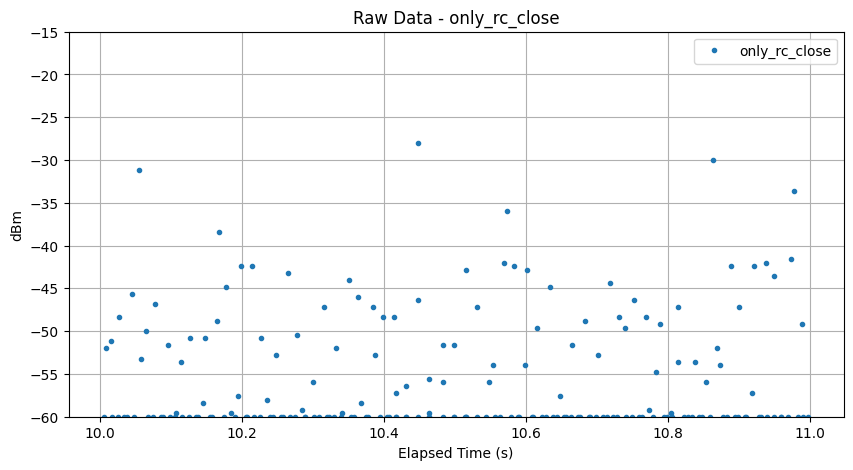

In [ ]:
df = pd.read_csv("raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_rc_close", linewidth=0.5)
plt.title(f"Raw Data - {"only_rc_close"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\3807061614.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


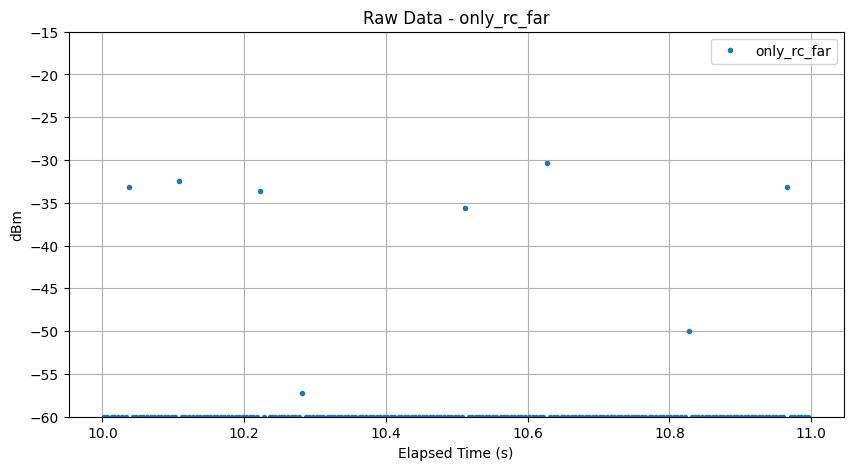

In [29]:
df = pd.read_csv("raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_rc_far", linewidth=0.5)
plt.title(f"Raw Data - {"only_rc_far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\3856571669.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


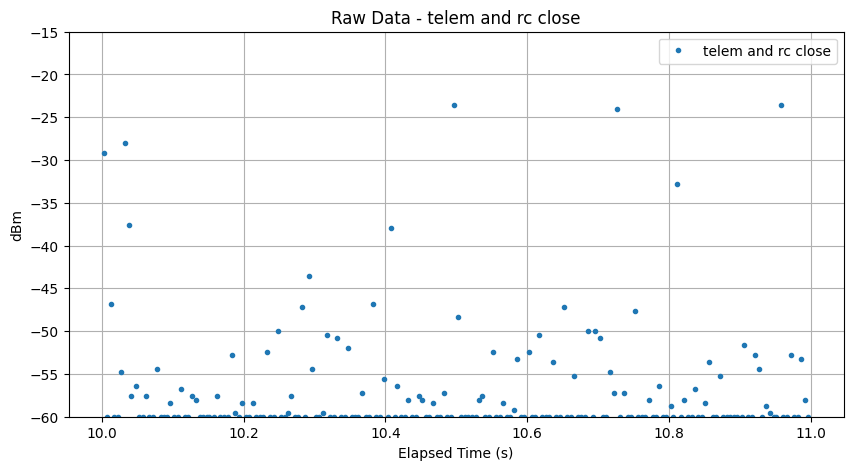

In [30]:
df = pd.read_csv("raw-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc close", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc close"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\2778007044.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


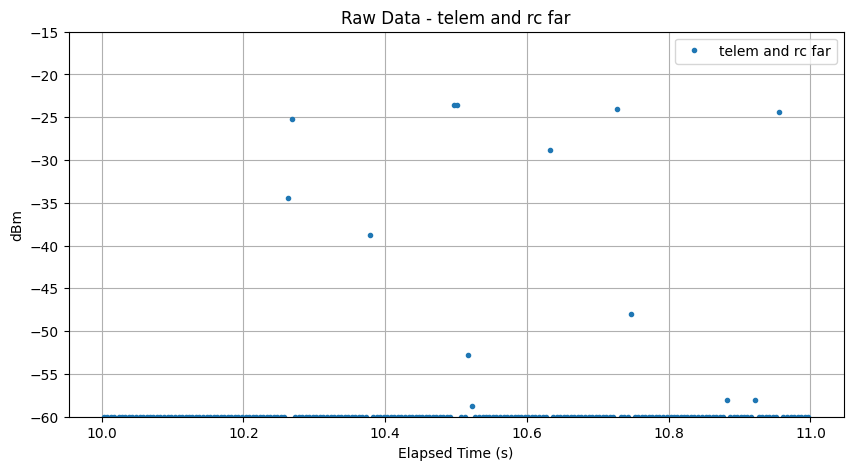

In [31]:
df = pd.read_csv("raw-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


median looks like a goo option looking at these graphs

check weird telem behaviour

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\73408411.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


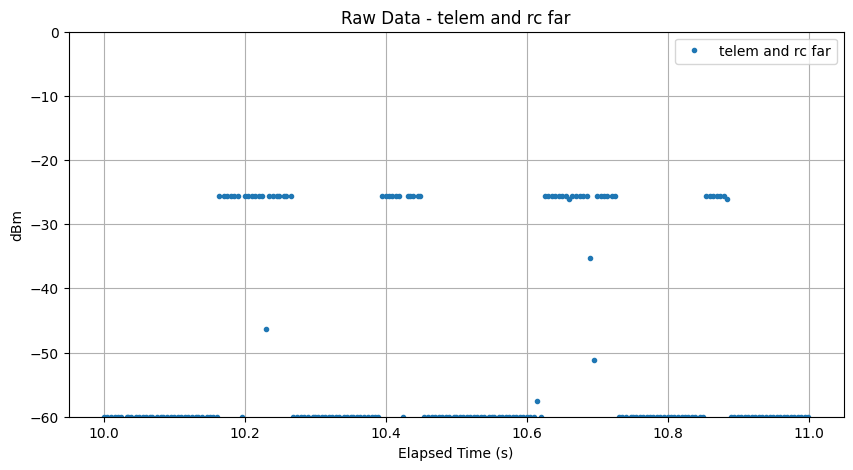

In [32]:
files=[
    # "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv"
    "raw-data/2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv",
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, 0)  
    plt.grid(True)
    plt.legend()


    plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\1239518883.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


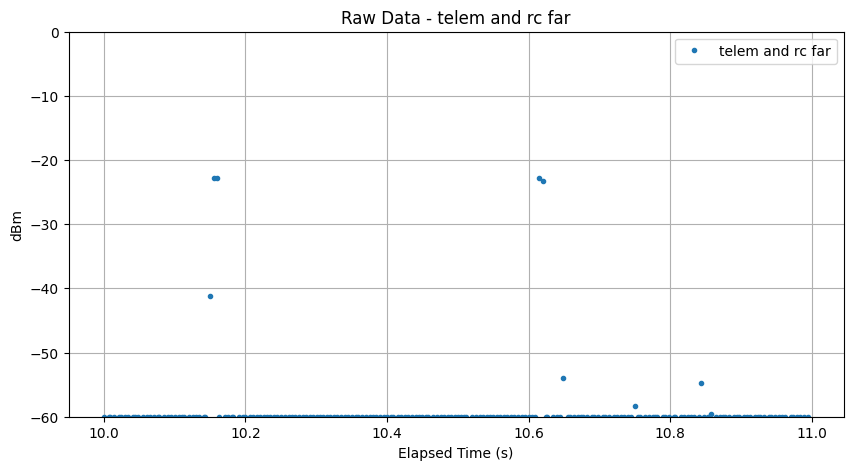

In [33]:
files=[
    "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-52-23_telem-oneside-3m--90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-57-45_telem-oneside-3m-90-antenna-45-raw.csv",
    # "raw-data\\2025-03-31_12-58-30_telem-oneside-3m-90-antenna-00-raw.csv",
    # "raw-data\\2025-03-31_12-59-10_telem-oneside-3m-90-antenna--45-raw.csv",
    # "raw-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90-raw.csv",
    # "raw-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90-raw.csv",
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, 0)  
    plt.grid(True)
    plt.legend()


    plt.show()

die shift in data komt hierdoor maar waarom precies? kkijk eens of connectie met mission planner een effect heeft

In [34]:
# df = pd.read_csv("raw-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv")

# df_filtered = df

# df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# # Plot the raw data
# plt.figure(figsize=(10, 5))
# # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
# plt.title(f"Raw Data - {"18dbm no telem"}")
# plt.xlabel("Elapsed Time (s)")
# plt.ylabel("dBm")
# plt.ylim(-60, -15)  
# plt.grid(True)
# plt.legend()


# plt.show()


# # Select only data where "Second" == 90
# for i in range(0,90,29):
#     df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

#     df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

#     # Plot the raw data
#     plt.figure(figsize=(10, 5))
#     # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


#     plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
#     plt.title(f"Raw Data - {"18dbm no telem"}")
#     plt.xlabel("Elapsed Time (s)")
#     plt.ylabel("dBm")
#     plt.ylim(-60, -15)  
#     plt.grid(True)
#     plt.legend()


#     plt.show()


niet echt iets te besluiten shift was er al van in begin en connectie met mp of andere telemetry heeft geen effect gehad

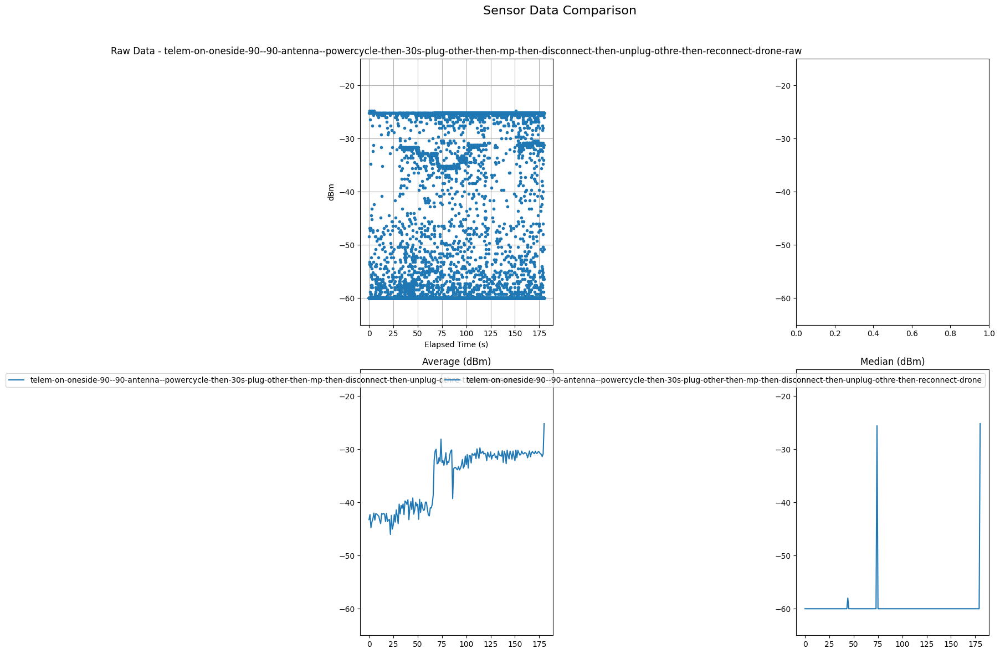

In [35]:
# Raw data files
raw_files = [
    "raw-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone-raw.csv",
    # "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv",    # "processed-data\\2025-03-05_17-23-07_drone-connected.csv",,

]
#seconde 70 was mp conected en aan het downloaden
# Processed data files
processed_files = [
    # "processed-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected.csv",    # "processed-data\\2025-03-05_17-23-07_drone-connected.csv",,
    "processed-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone.csv"
    ]
    # data_dict = {}

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[0, i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[0, i].set_title(f"Raw Data - {custom_param}")
        axes[0, i].set_xlabel("Elapsed Time (s)")
        axes[0, i].set_ylabel("dBm")
        axes[0, i].set_ylim(-60, -15)
        axes[0, i].grid(True)

# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[1, 0].plot(df["Average"], label=custom_param)
        axes[1, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[1, 0].set_title("Average (dBm)")
        axes[1, 1].set_title("Median (dBm)")
        axes[1, 0].legend()
        axes[1, 1].legend()
        for i in range(2):
            for j in range(2):
                axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
# for file_name, avg_value in average_dbm_per_file.items():
#     axes[2, 0].scatter(file_name, avg_value, color="b", marker="o")
# axes[2, 0].set_title("Average of 'Average' per File (dBm)")
# axes[2, 0].set_xlabel("CSV File")
# axes[2, 0].set_ylabel("dBm")
# axes[2, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
# for file_name, avg_value in average_median_dbm_per_file.items():
#     axes[2, 1].scatter(file_name, avg_value, color="g", marker="s")
# axes[2, 1].set_title("Average of 'Median' per File (dBm)")
# axes[2, 1].set_xlabel("CSV File")
# axes[2, 1].set_ylabel("dBm")
# axes[2, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

oké dus vanaf dat je connect met MP gaat telemetry in ander regime werken en verschijnen die shifts. maakt niet uit of andere kant disconnect en of reconnect, die streepjes blijven.

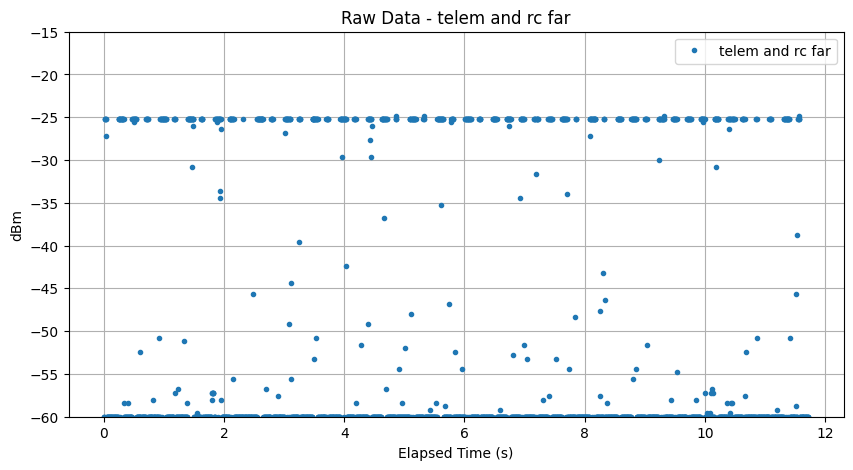

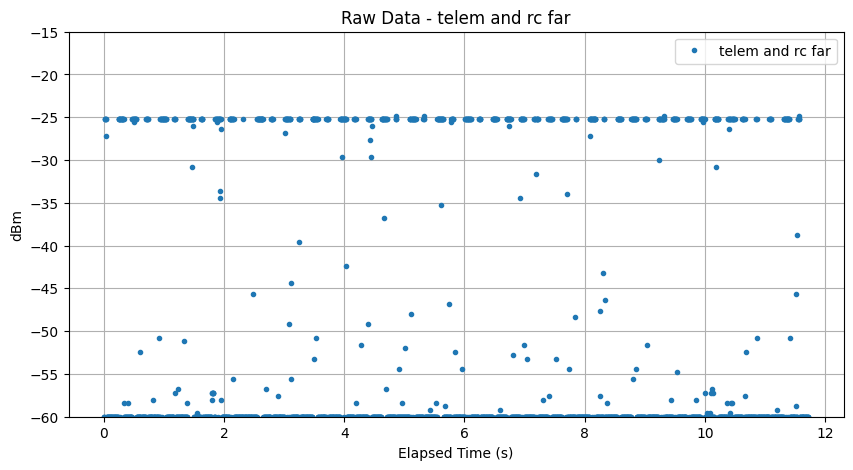

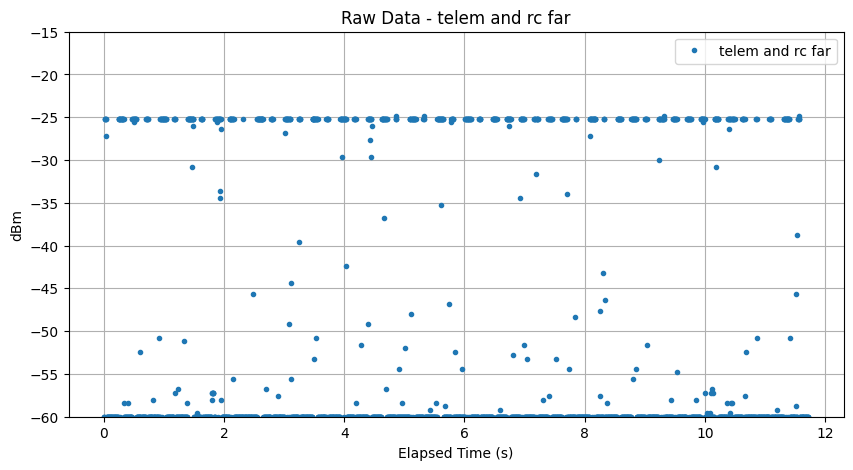

In [36]:
files=[
    "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv"
]
for file in files:
    for i in range(0,30,10):
        df = pd.read_csv(file)

        # Select only data where "Second" == 90
        df_filtered = df#[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

        df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

        # Plot the raw data
        plt.figure(figsize=(10, 5))
        # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


        plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
        plt.title(f"Raw Data - {"telem and rc far"}")
        plt.xlabel("Elapsed Time (s)")
        plt.ylabel("dBm")
        plt.ylim(-60, -15)  
        plt.grid(True)
        plt.legend()


        plt.show()


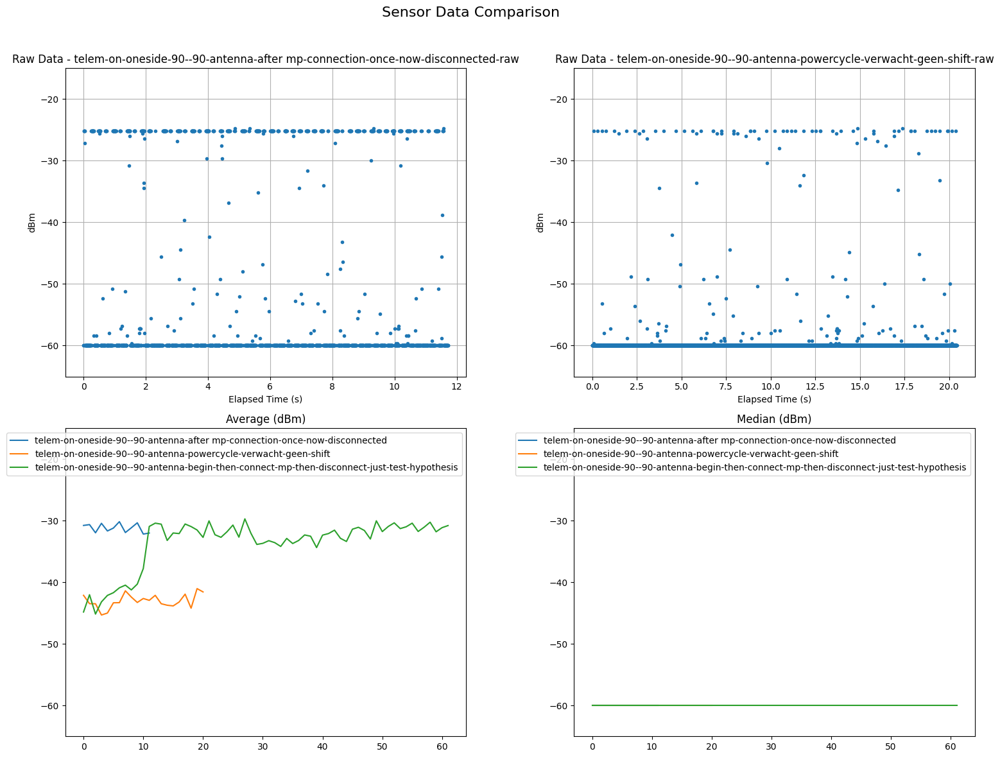

In [37]:
# Raw data files
raw_files = [
    "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv",
    "raw-data\\2025-04-01_17-15-23_telem-on-oneside-90--90-antenna-powercycle-verwacht-geen-shift-raw.csv",
]
# Processed data files
processed_files = [
    "processed-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected.csv",
    "processed-data\\2025-04-01_17-15-23_telem-on-oneside-90--90-antenna-powercycle-verwacht-geen-shift.csv",    
    "processed-data\\2025-04-01_17-21-25_telem-on-oneside-90--90-antenna-begin-then-connect-mp-then-disconnect-just-test-hypothesis.csv"
    # data_dict = {}
]
# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[0, i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[0, i].set_title(f"Raw Data - {custom_param}")
        axes[0, i].set_xlabel("Elapsed Time (s)")
        axes[0, i].set_ylabel("dBm")
        axes[0, i].set_ylim(-60, -15)
        axes[0, i].grid(True)

# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[1, 0].plot(df["Average"], label=custom_param)
        axes[1, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[1, 0].set_title("Average (dBm)")
        axes[1, 1].set_title("Median (dBm)")
        axes[1, 0].legend()
        axes[1, 1].legend()
        for i in range(2):
            for j in range(2):
                axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
# for file_name, avg_value in average_dbm_per_file.items():
#     axes[2, 0].scatter(file_name, avg_value, color="b", marker="o")
# axes[2, 0].set_title("Average of 'Average' per File (dBm)")
# axes[2, 0].set_xlabel("CSV File")
# axes[2, 0].set_ylabel("dBm")
# axes[2, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
# for file_name, avg_value in average_median_dbm_per_file.items():
#     axes[2, 1].scatter(file_name, avg_value, color="g", marker="s")
# axes[2, 1].set_title("Average of 'Median' per File (dBm)")
# axes[2, 1].set_xlabel("CSV File")
# axes[2, 1].set_ylabel("dBm")
# axes[2, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [38]:
# files=[
#     "raw-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone-raw.csv"
# ]
# for file in files:
#     for i in range(0,181,10):
#         df = pd.read_csv(file)

#         # Select only data where "Second" == 90
#         df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

#         df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

#         # Plot the raw data
#         plt.figure(figsize=(10, 5))
#         # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


#         plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
#         plt.title(f"Raw Data - {"telem and rc far"}")
#         plt.xlabel("Elapsed Time (s)")
#         plt.ylabel("dBm")
#         plt.ylim(-60, -15)  
#         plt.grid(True)
#         plt.legend()


#         plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\2015063923.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


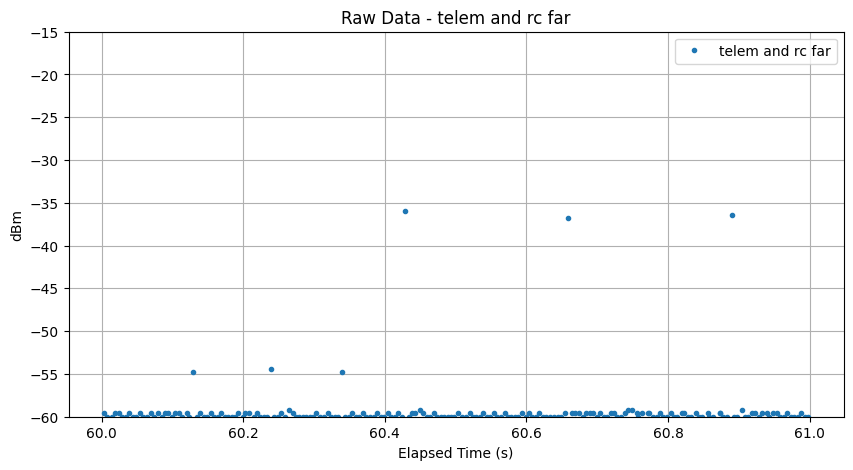

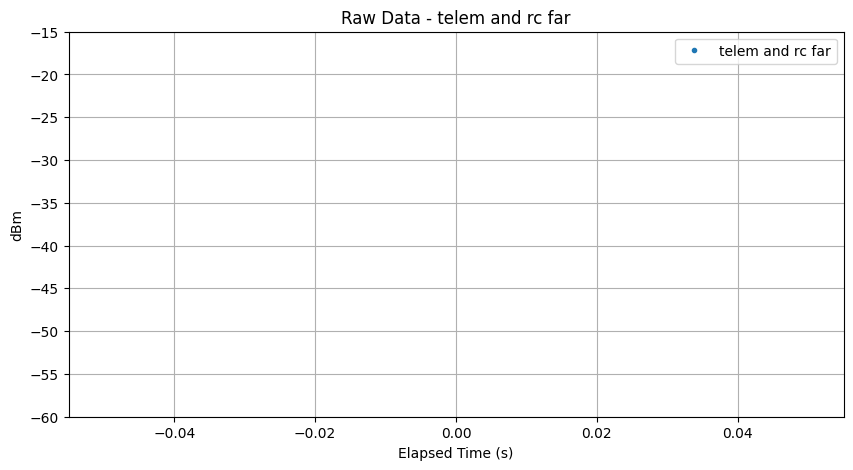

In [39]:
files=[
    "raw-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv"
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 60) & (df["Elapsed Time (s)"] < 61)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, -15)  
    plt.grid(True)
    plt.legend()


    plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\3569666353.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


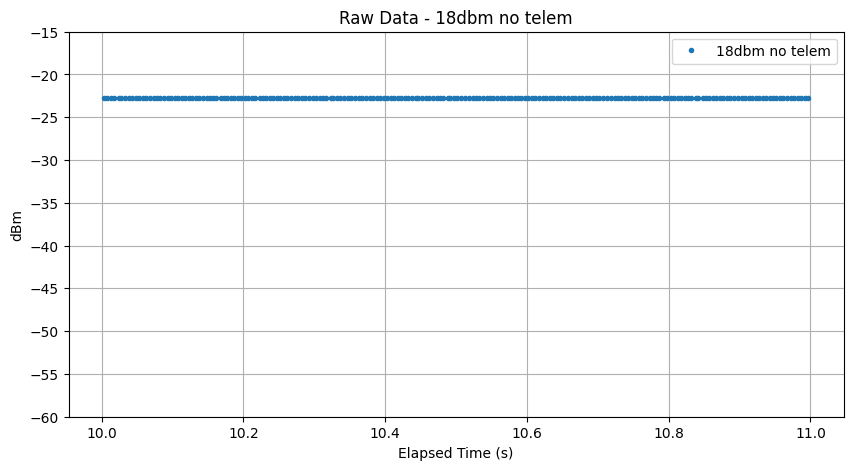

In [40]:
df = pd.read_csv("raw-data\\2025-03-29_17-46-31_antenna-00-18dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
plt.title(f"Raw Data - {"18dbm no telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


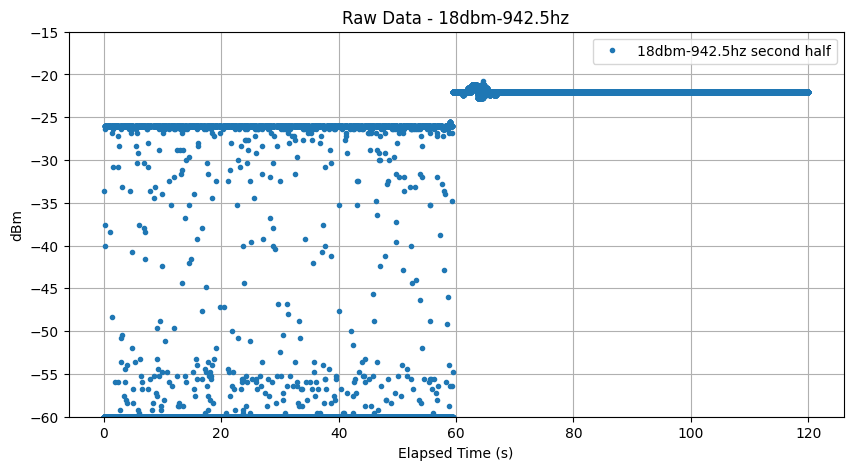

In [50]:
df = pd.read_csv("raw-data\\2025-03-29_17-42-46_telem-oneside-3m-90-antenna-00-second-half-18dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df#[(df["Elapsed Time (s)"] >=100) & (df["Elapsed Time (s)"] < 101)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm-942.5hz second half", linewidth=0.5)
plt.title(f"Raw Data - {"18dbm-942.5hz"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\2751091330.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


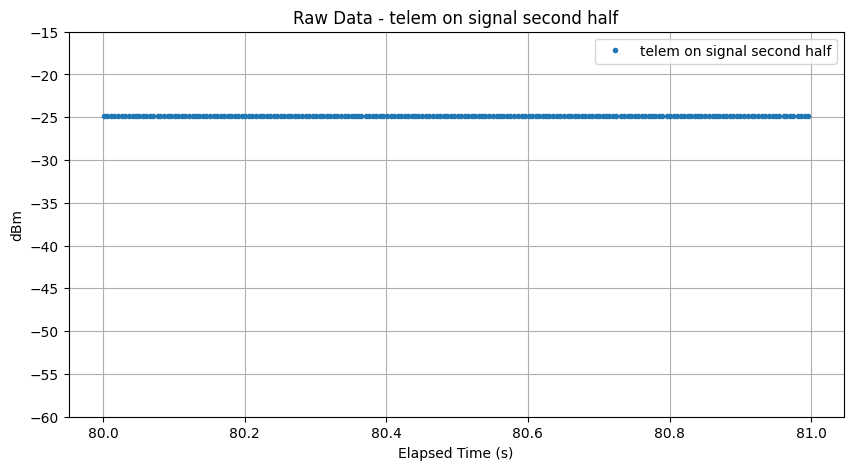

In [ ]:
df = pd.read_csv("raw-data\\2025-03-29_17-39-16_telem-oneside-3m-90-antenna-00-second-half-15dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >=80) & (df["Elapsed Time (s)"] < 81)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem on signal second half", linewidth=0.5)
plt.title(f"Raw Data - {"telem on signal second half"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()

nog geen verklaring kunnen vinden waarom die shift er is. De shift is er zowel als temeetry alleen is, als ook als er 2 telemetry radios met elkaar verbonden zijn, zie mss eens met opstart effect of dat dat er iets mee te maken heeft.

eens kijken naar background

C:\Users\Raman\AppData\Local\Temp\ipykernel_7288\1980398165.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


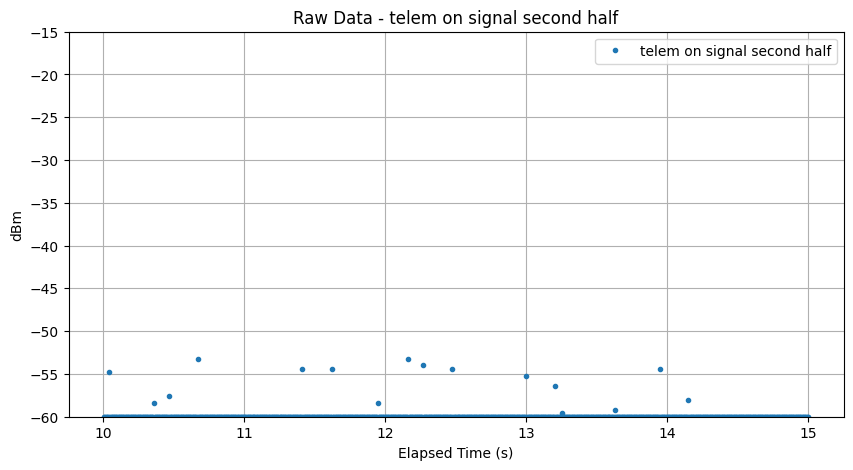

In [43]:
df = pd.read_csv("raw-data\\2025-03-05_17-19-04_background-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >=10) & (df["Elapsed Time (s)"] < 15)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem on signal second half", linewidth=0.5)
plt.title(f"Raw Data - {"telem on signal second half"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


0dbm source

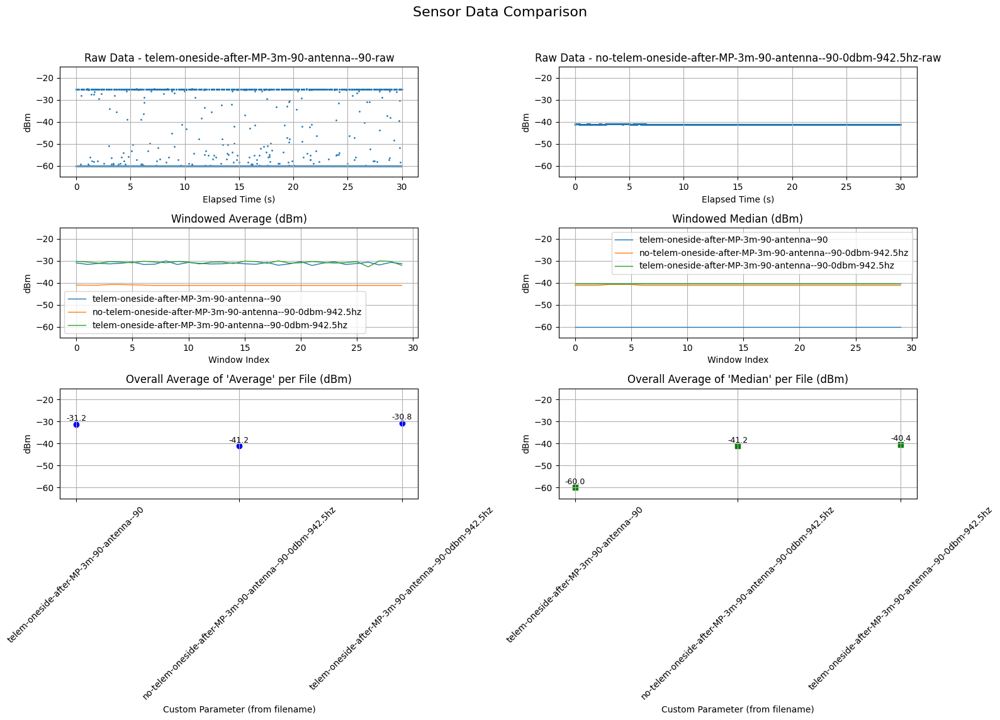

In [44]:

# Raw data files
raw_files = [
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
]

# Processed data files
processed_files = [
    # "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    "processed-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz.csv",
    "processed-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz.csv"

]
make_plot(raw_files,processed_files)



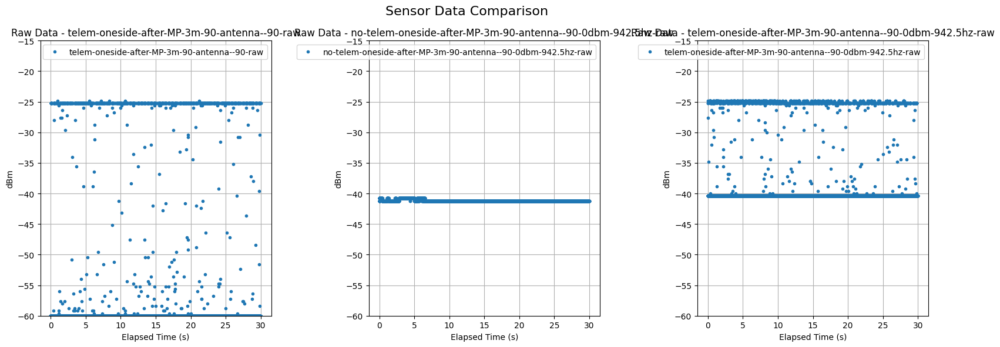

In [45]:
raw_files = [
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv",
    "raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

shielding

Processing: 2025-03-29_11-45-52_so773mhz-18dbm.csv
Processing: 2025-03-29_12-17-02_so773mhz-15dbm.csv
Processing: 2025-03-29_12-34-24_so942.5mhz-18dbm.csv
Processing: 2025-03-29_12-45-44_so942.5mhz-15dbm.csv
Processing: 2025-03-29_12-52-44_so1842.5mhz-18dbm.csv
Processing: 2025-03-29_13-09-40_so1842.5mhz-15dbm.csv
Processing: 2025-03-29_13-16-46_so2140mhz-18dbm.csv
Processing: 2025-03-29_13-42-10_so2140mhz-15dbm.csv
Processing: 2025-03-29_13-48-49_so3600mhz-18dbm.csv
Processing: 2025-03-29_14-15-43_so3600mhz-15dbm.csv
Processing: 2025-03-29_14-31-01_1842.5mhz-15dbm.csv
Processing: 2025-03-29_14-49-49_1842.5mhz-18dbm.csv
Processing: 2025-03-29_14-59-21_773mhz-18dbm.csv
Processing: 2025-03-29_15-07-47_773mhz-15dbm.csv
Processing: 2025-03-29_15-15-41_942.5mhz-18dbm.csv
Processing: 2025-03-29_15-23-47_942.5mhz-15dbm.csv
Processing: 2025-03-29_15-35-43_2140mhz-18dbm.csv
Processing: 2025-03-29_15-42-41_2140mhz-15dbm.csv
Processing: 2025-03-29_16-02-31_3600mhz-18dbm.csv
Processing: 2025-03-29

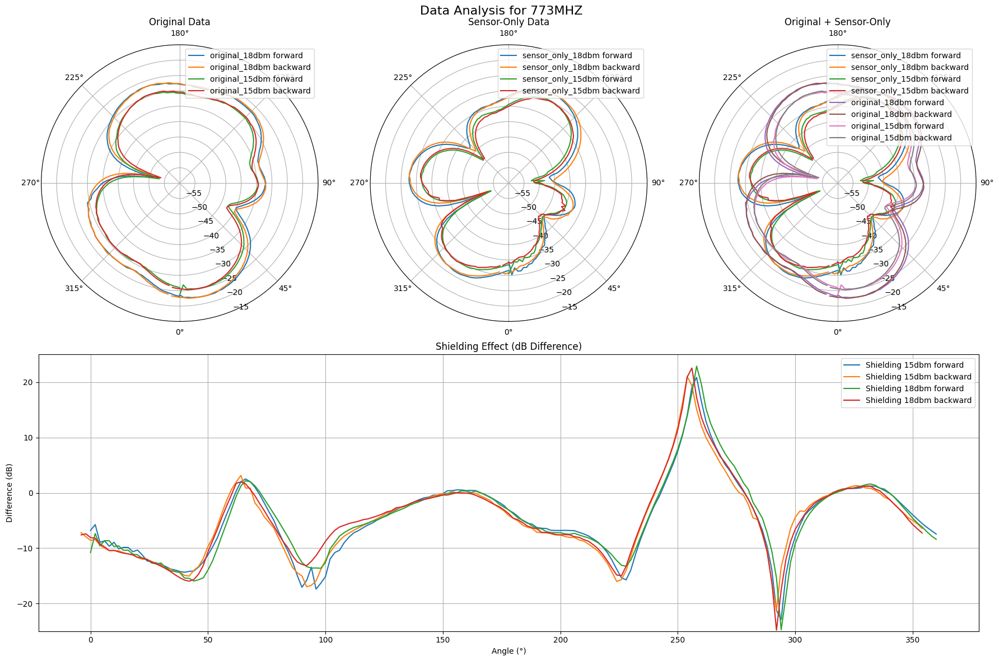

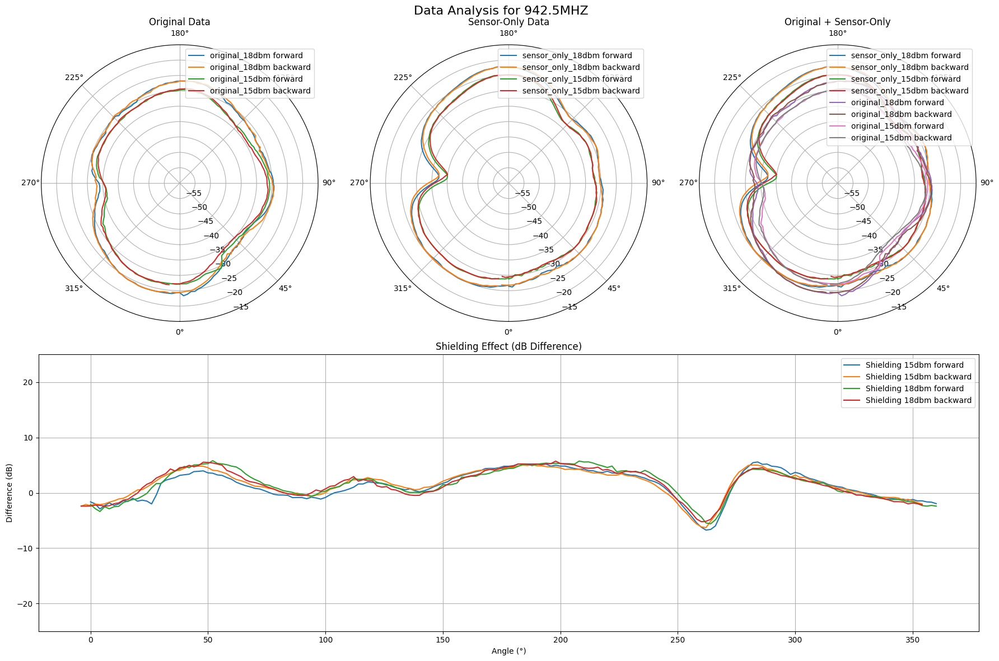

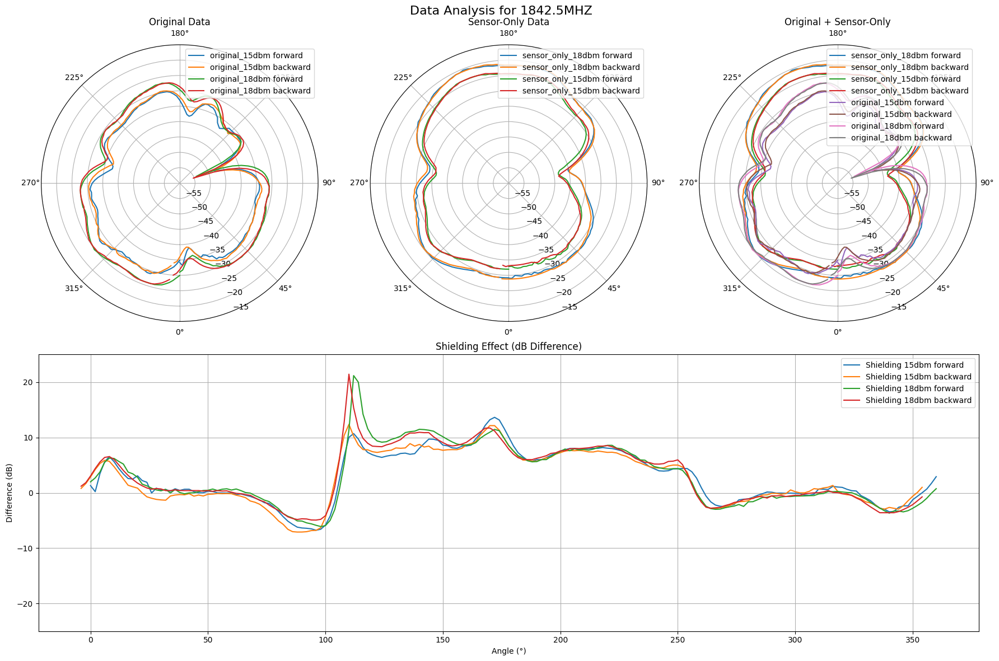

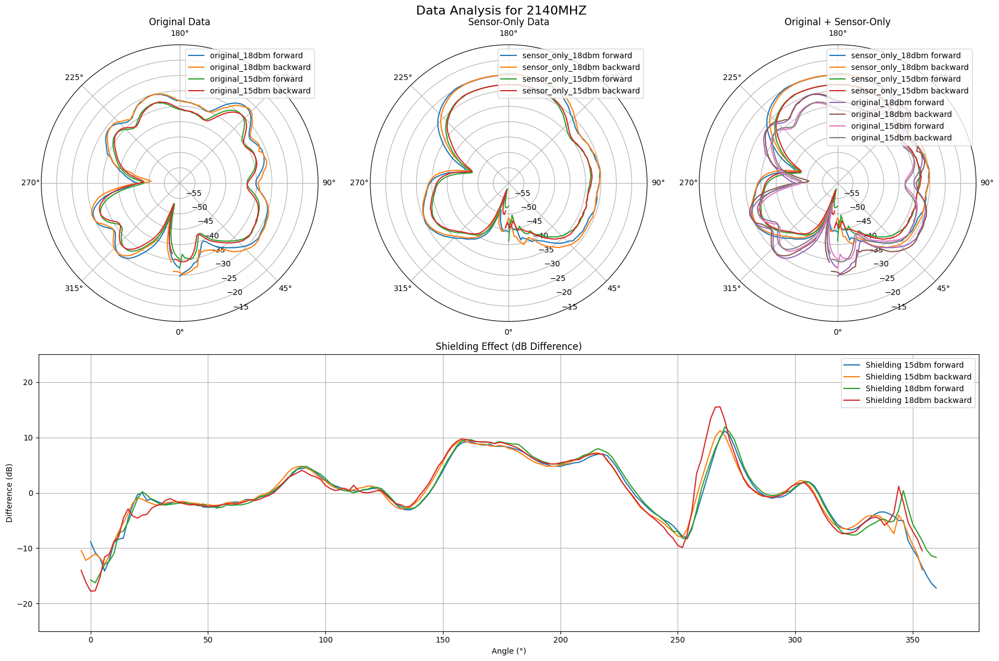

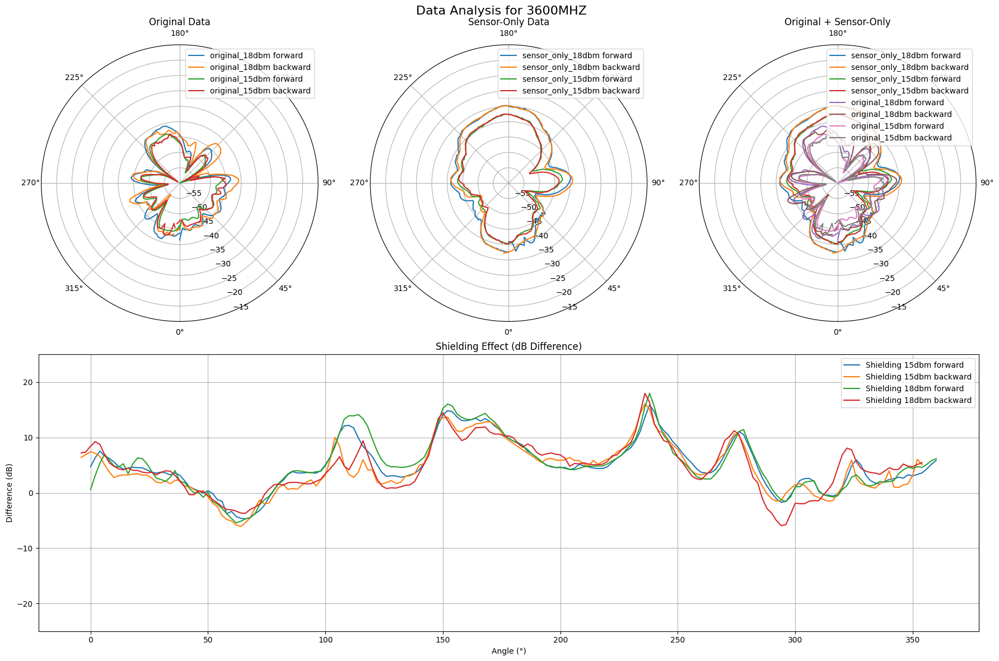

In [46]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the folder where CSV files are stored
csv_folder = "draaitafel-processed-data"

# Find all CSV files in the folder
csv_files = glob.glob(os.path.join(csv_folder, "*.csv"))

# Dictionary to store processed data grouped by frequency
data_dict = {}

# Read each CSV file and process the data
for file in csv_files:
    try:
        filename = os.path.basename(file)
        print(f"Processing: {filename}")

        parts = filename.split("_")
        if len(parts) < 3:
            print(f"Skipping {file}: Incorrect filename format")
            continue
        
        freq_dbm = parts[-1].replace(".csv", "")  
        frequency, source_dbm = freq_dbm.split("-")
        is_sensor_only = "so" in frequency
        if is_sensor_only:
            frequency = frequency[2:]

        df = pd.read_csv(file)

        required_columns = {"Second", "Average"}
        if required_columns.issubset(df.columns):
            df["Angle (°)"] = df["Second"] * 2
            
            df_forward = df[df["Second"] <= 180].copy()
            df_backward = df[df["Second"] > 181].copy()
            df_backward.loc[:, "Angle (°)"] = 720 - df_backward["Angle (°)"] - 2
            
            df_forward.loc[:, "Angle (rad)"] = np.radians(df_forward["Angle (°)"])
            df_backward.loc[:, "Angle (rad)"] = np.radians(df_backward["Angle (°)"])

            if frequency not in data_dict:
                data_dict[frequency] = {}

            key = f"{'sensor_only' if is_sensor_only else 'original'}_{source_dbm}"
            data_dict[frequency][key] = {
                "forward": df_forward,
                "backward": df_backward
            }
        
        else:
            print(f"Skipping {file}: Incorrect columns detected")

    except Exception as e:
        print(f"Error processing {file}: {e}")

if not data_dict:
    print("No valid CSV files found.")
    exit()

# Generate plots for each frequency
for frequency, dbm_data in data_dict.items():
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(2, 3)  # Define a 2-row, 3-column grid

    # First row: Three separate polar plots
    axes = []
    for i in range(3):
        ax = fig.add_subplot(gs[0, i], projection='polar')  # Polar projection for top row
        axes.append(ax)

    # Second row: One wide Cartesian plot spanning all 3 columns
    ax_cartesian = fig.add_subplot(gs[1, :])  # Spans all columns

    fig.suptitle(f"Data Analysis for {frequency.upper()}", fontsize=16)

    # First plot: Original Data
    for key, df_dict in dbm_data.items():
        if "original" in key:
            for direction, df in df_dict.items():
                axes[0].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[0].set_title("Original Data")

    # Second plot: Sensor-Only Data
    for key, df_dict in dbm_data.items():
        if "sensor_only" in key:
            for direction, df in df_dict.items():
                axes[1].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[1].set_title("Sensor-Only Data")

    # Third plot: Original + Sensor-Only
    for key, df_dict in dbm_data.items():
        for direction, df in df_dict.items():
            axes[2].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[2].set_title("Original + Sensor-Only")

    # Formatting for polar plots
    for ax in axes:
        ax.set_theta_zero_location("S")
        ax.set_theta_direction(1)
        ax.set_xticks(np.radians([0, 45, 90, 135, 180, 225, 270, 315]))
        ax.set_xticklabels(["0°", "45°", "90°", "135°", "180°", "225°", "270°", "315°"])
        ax.set_ylim([-60, -15])
        ax.legend(loc="upper right")

    # Bottom row: Shielding Effect (Cartesian Plot)
    for source_dbm in ["15dbm", "18dbm"]:
        if f"original_{source_dbm}" in dbm_data and f"sensor_only_{source_dbm}" in dbm_data:
            for direction in ["forward", "backward"]:
                df_orig = dbm_data[f"original_{source_dbm}"][direction]
                df_sensor = dbm_data[f"sensor_only_{source_dbm}"][direction]
                
                if len(df_orig) == len(df_sensor):
                    shielding_effect = df_sensor["Average"].values - df_orig["Average"].values
                    ax_cartesian.plot(df_orig["Angle (°)"], shielding_effect, label=f"Shielding {source_dbm} {direction}", linewidth=1.5)
    
    ax_cartesian.set_title("Shielding Effect (dB Difference)")
    ax_cartesian.set_xlabel("Angle (°)")
    ax_cartesian.set_ylabel("Difference (dB)")
    ax_cartesian.set_ylim([-25,25])
    ax_cartesian.grid(True)
    ax_cartesian.legend()

    plt.tight_layout()
    plt.show()


In [47]:
import pandas as pd

# Define key angles in degrees
key_angles = [0,46, 90,90+46, 180,180+46, 270]

# List to store data for DataFrame
comparison_data = []

for frequency, dbm_data in data_dict.items():
    for source_dbm in ["15dbm", "18dbm"]:
        if f"original_{source_dbm}" in dbm_data and f"sensor_only_{source_dbm}" in dbm_data:
            for direction in ["forward", "backward"]:
                df_orig = dbm_data[f"original_{source_dbm}"][direction]
                df_sensor = dbm_data[f"sensor_only_{source_dbm}"][direction]

                if len(df_orig) == len(df_sensor):
                    # Extract dBm values at key angles
                    key_data_orig = df_orig[df_orig["Angle (°)"].isin(key_angles)]
                    key_data_sensor = df_sensor[df_sensor["Angle (°)"].isin(key_angles)]

                    # Ensure both dataframes have the same angles (just in case)
                    key_data = key_data_orig.merge(key_data_sensor, on="Angle (°)", suffixes=("_orig", "_sensor"))

                    # Add data to list
                    for _, row in key_data.iterrows():
                        comparison_data.append({
                            "Frequency": frequency,
                            "Source dBm": source_dbm,
                            "Direction": direction,
                            "Angle (°)": row["Angle (°)"],
                            "Original Median (dBm)": row["Median_orig"],
                            "Sensor Median (dBm)": row["Median_sensor"],
                            "Difference (Original - Sensor)": row["Median_orig"] - row["Median_sensor"]
                        })

# Convert list to DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Display the DataFrame
comparison_df

,Frequency,Source dBm,Direction,Angle (°),Original Median (dBm),Sensor Median (dBm),Difference (Original - Sensor)
0,773mhz,15dbm,forward,0.0,-23.6,-30.4,6.8
1,773mhz,15dbm,forward,46.0,-30.8,-44.4,13.6
2,773mhz,15dbm,forward,90.0,-34.4,-51.2,16.8
3,773mhz,15dbm,forward,136.0,-30.0,-32.0,2.0
4,773mhz,15dbm,forward,180.0,-30.8,-34.4,3.6
...,...,...,...,...,...,...,...
135,3600mhz,18dbm,backward,180.0,-44.8,-34.8,-10.0
136,3600mhz,18dbm,backward,136.0,-42.4,-40.8,-1.6
137,3600mhz,18dbm,backward,90.0,-41.2,-39.2,-2.0
138,3600mhz,18dbm,backward,46.0,-44.8,-44.4,-0.4



📊 Shielding Analysis for 1842.5MHZ - 15DBM
    Angle (°)  Difference (Original - Sensor)
56        0.0                            -1.6
57       46.0                             0.0
58       90.0                             6.0
59      136.0                            -6.8
60      180.0                            -8.8
61      226.0                            -7.6
62      270.0                             2.4
63      270.0                             2.4
64      226.0                            -6.8
65      180.0                            -7.6
66      136.0                            -8.8
67       90.0                             7.2
68       46.0                             0.4
69        0.0                            -2.8
Mean Shielding: -2.314285714285716 dB
Median Shielding: -2.1999999999999957 dB
Max Shielding: 7.199999999999989 dB at 90.0 °
Min Shielding: -8.800000000000004 dB at 180.0 °


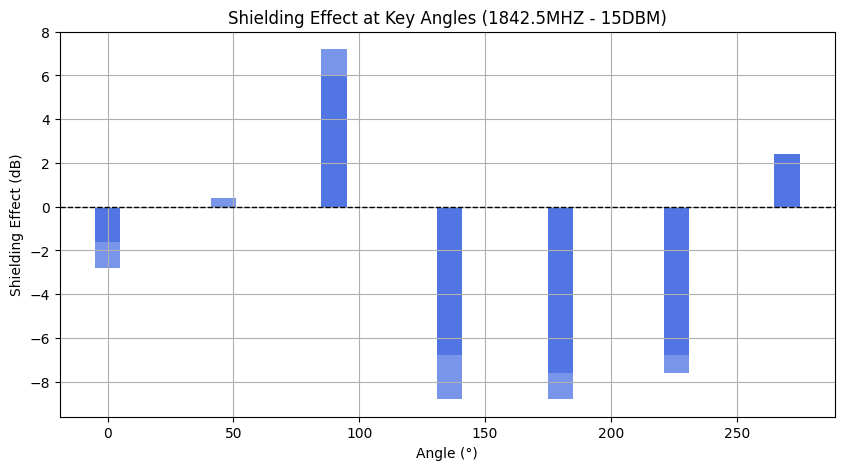

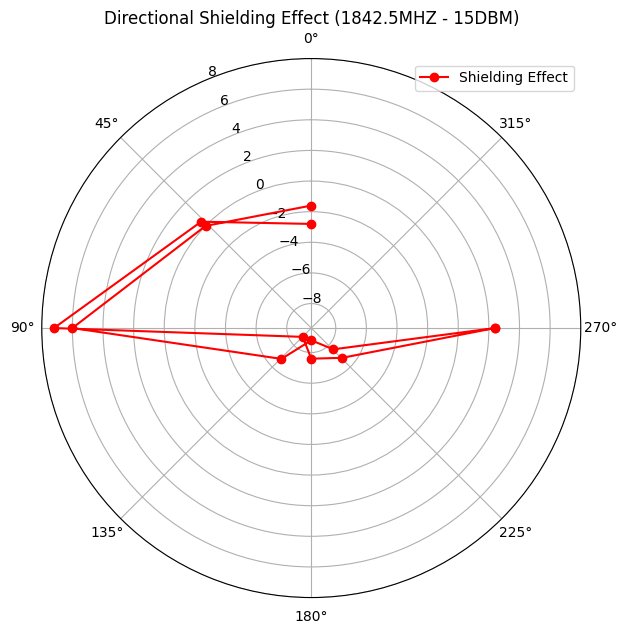


📊 Shielding Analysis for 1842.5MHZ - 18DBM
    Angle (°)  Difference (Original - Sensor)
70        0.0                            -2.0
71       46.0                            -0.4
72       90.0                             5.2
73      136.0                           -11.2
74      180.0                            -7.6
75      226.0                            -8.0
76      270.0                             2.8
77      270.0                             2.4
78      226.0                            -7.6
79      180.0                            -6.8
80      136.0                           -10.8
81       90.0                             4.8
82       46.0                            -0.4
83        0.0                            -3.2
Mean Shielding: -3.057142857142858 dB
Median Shielding: -2.5999999999999996 dB
Max Shielding: 5.199999999999992 dB at 90.0 °
Min Shielding: -11.200000000000006 dB at 136.0 °


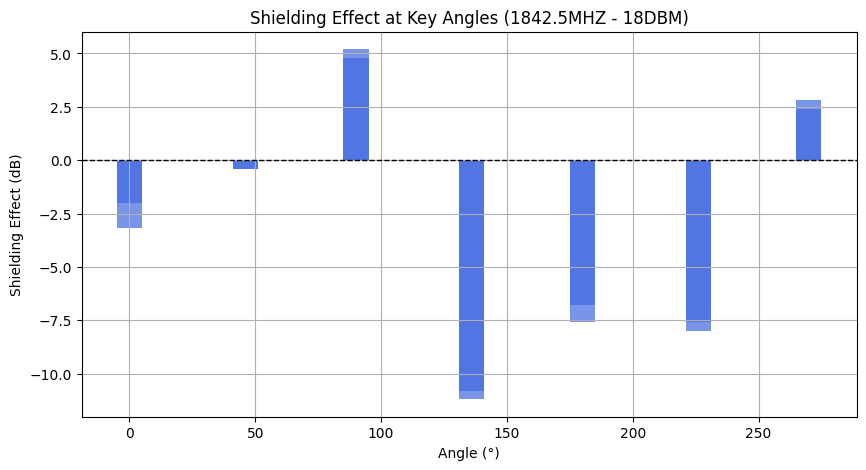

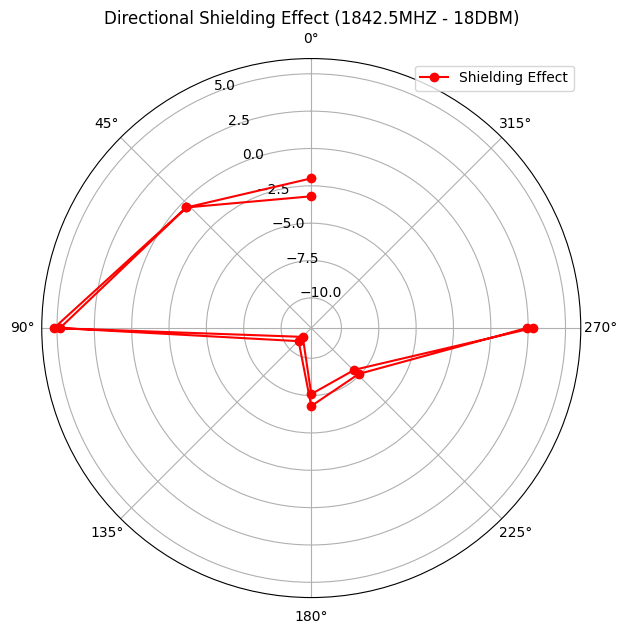


📊 Shielding Analysis for 2140MHZ - 15DBM
    Angle (°)  Difference (Original - Sensor)
84        0.0                            10.4
85       46.0                             2.4
86       90.0                            -4.4
87      136.0                             2.8
88      180.0                            -8.0
89      226.0                            -3.2
90      270.0                           -11.2
91      270.0                           -10.8
92      226.0                            -2.0
93      180.0                            -8.0
94      136.0                             2.4
95       90.0                            -4.8
96       46.0                             2.0
97        0.0                            11.6
Mean Shielding: -1.485714285714284 dB
Median Shielding: -2.6000000000000014 dB
Max Shielding: 11.599999999999994 dB at 0.0 °
Min Shielding: -11.199999999999989 dB at 270.0 °


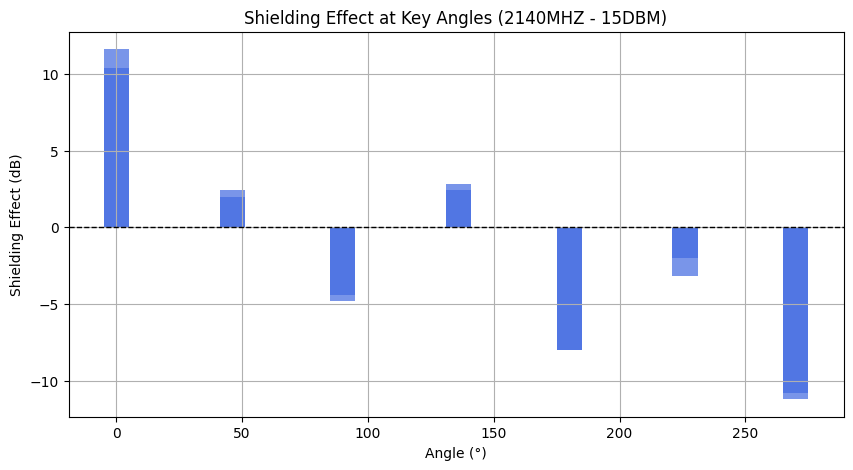

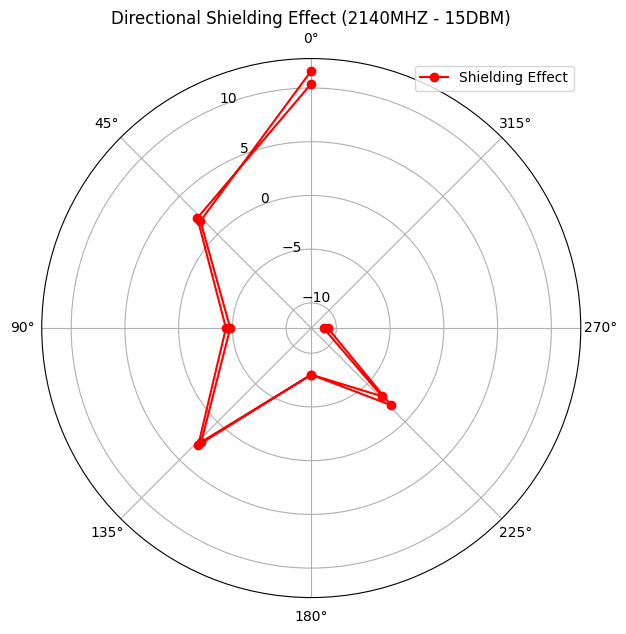


📊 Shielding Analysis for 2140MHZ - 18DBM
     Angle (°)  Difference (Original - Sensor)
98         0.0                            17.4
99        46.0                             2.4
100       90.0                            -4.8
101      136.0                             2.8
102      180.0                            -8.8
103      226.0                            -3.6
104      270.0                           -11.6
105      270.0                           -13.2
106      226.0                            -2.4
107      180.0                            -8.4
108      136.0                             2.4
109       90.0                            -4.0
110       46.0                             2.4
111        0.0                            18.0
Mean Shielding: -0.8142857142857137 dB
Median Shielding: -3.0000000000000018 dB
Max Shielding: 17.999999999999996 dB at 0.0 °
Min Shielding: -13.199999999999989 dB at 270.0 °


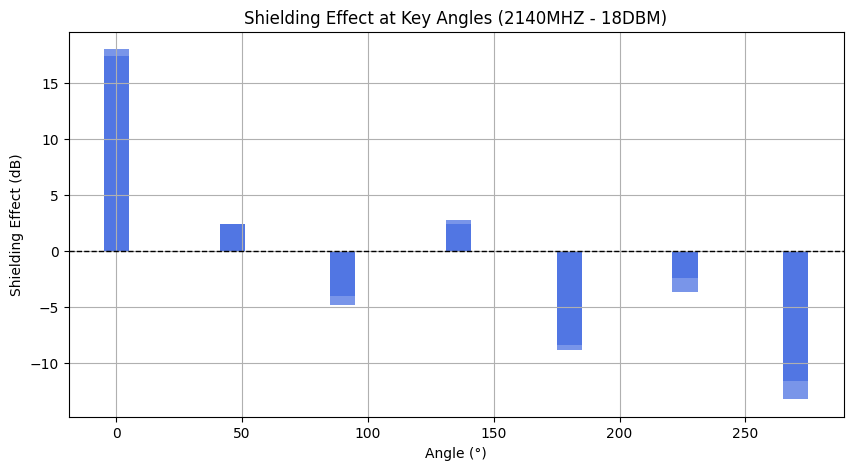

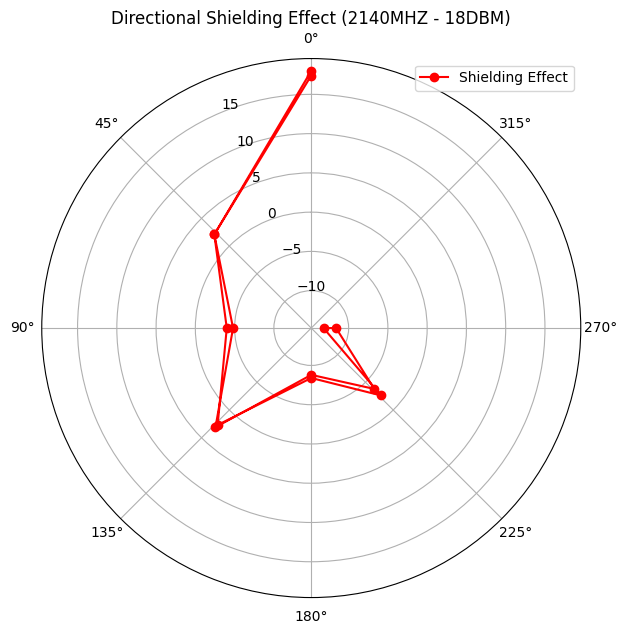


📊 Shielding Analysis for 3600MHZ - 15DBM
     Angle (°)  Difference (Original - Sensor)
112        0.0                            -4.8
113       46.0                            -0.4
114       90.0                            -3.2
115      136.0                            -3.2
116      180.0                            -9.6
117      226.0                            -6.8
118      270.0                            -7.2
119      270.0                            -7.2
120      226.0                            -7.6
121      180.0                            -8.8
122      136.0                            -2.8
123       90.0                            -2.0
124       46.0                             0.0
125        0.0                            -7.6
Mean Shielding: -5.0857142857142845 dB
Median Shielding: -5.800000000000001 dB
Max Shielding: 0.0 dB at 46.0 °
Min Shielding: -9.599999999999987 dB at 180.0 °


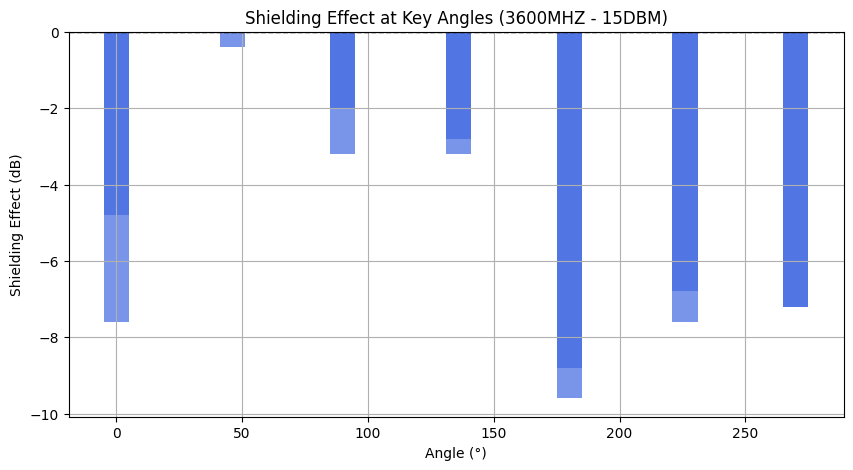

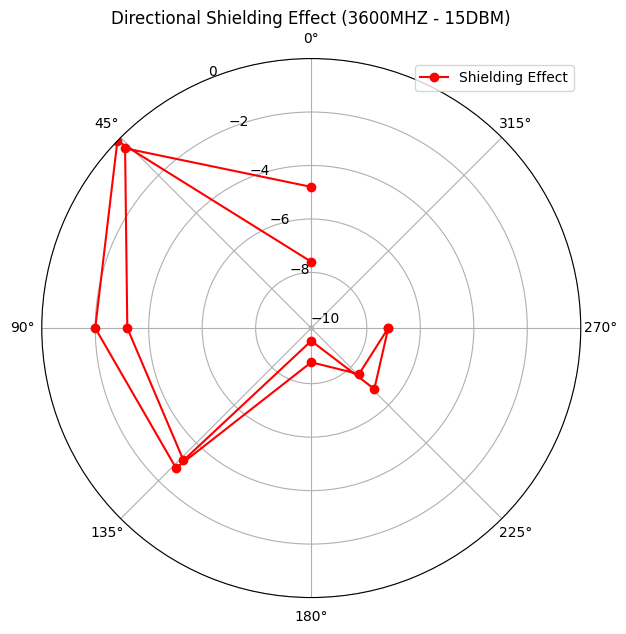


📊 Shielding Analysis for 3600MHZ - 18DBM
     Angle (°)  Difference (Original - Sensor)
126        0.0                            -0.8
127       46.0                             0.0
128       90.0                            -4.0
129      136.0                            -4.8
130      180.0                            -9.6
131      226.0                            -6.8
132      270.0                            -6.0
133      270.0                            -9.6
134      226.0                            -7.6
135      180.0                           -10.0
136      136.0                            -1.6
137       90.0                            -2.0
138       46.0                            -0.4
139        0.0                            -8.4
Mean Shielding: -5.114285714285712 dB
Median Shielding: -5.399999999999995 dB
Max Shielding: 0.0 dB at 46.0 °
Min Shielding: -9.999999999999993 dB at 180.0 °


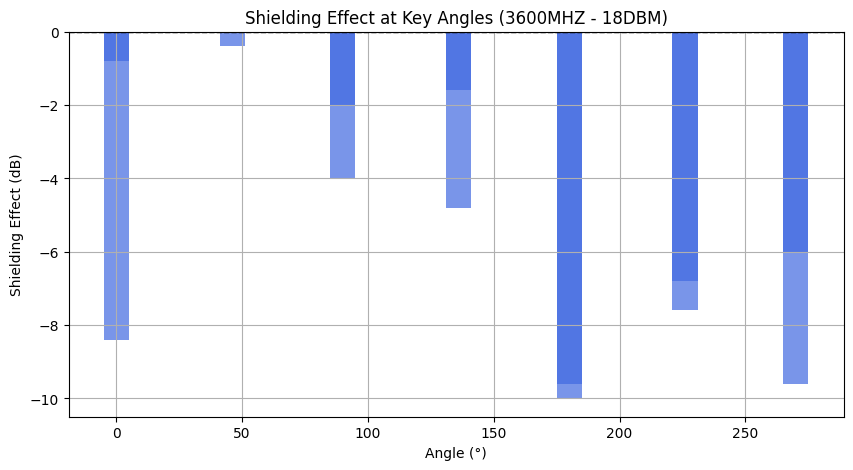

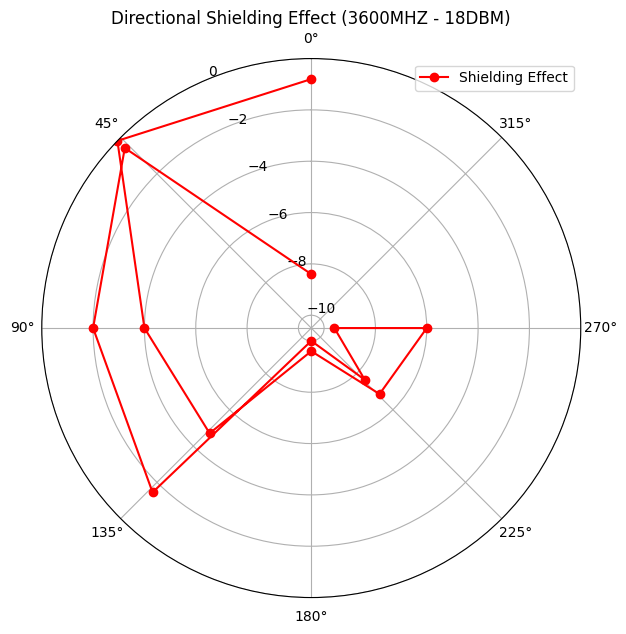


📊 Shielding Analysis for 773MHZ - 15DBM
    Angle (°)  Difference (Original - Sensor)
0         0.0                             6.8
1        46.0                            13.6
2        90.0                            16.8
3       136.0                             2.0
4       180.0                             3.6
5       226.0                            15.2
6       270.0                            -4.8
7       270.0                            -4.0
8       226.0                            15.6
9       180.0                             4.8
10      136.0                             2.0
11       90.0                            15.2
12       46.0                            13.6
13        0.0                             8.4
Mean Shielding: 7.771428571428572 dB
Median Shielding: 7.600000000000001 dB
Max Shielding: 16.800000000000004 dB at 90.0 °
Min Shielding: -4.799999999999997 dB at 270.0 °


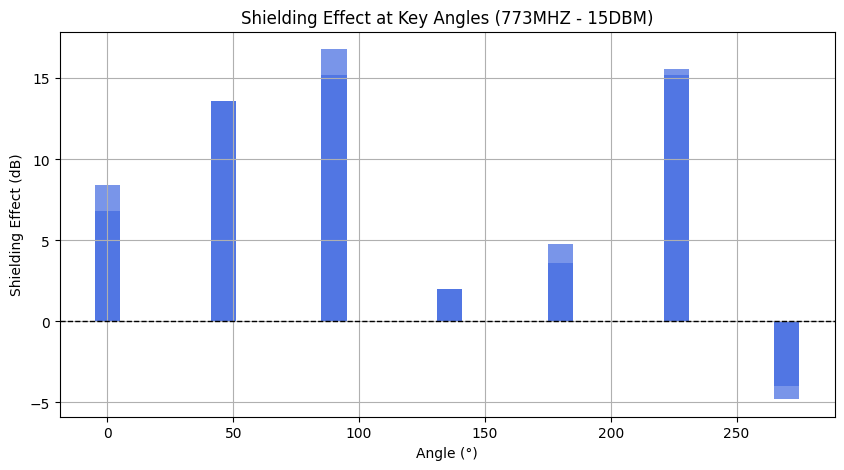

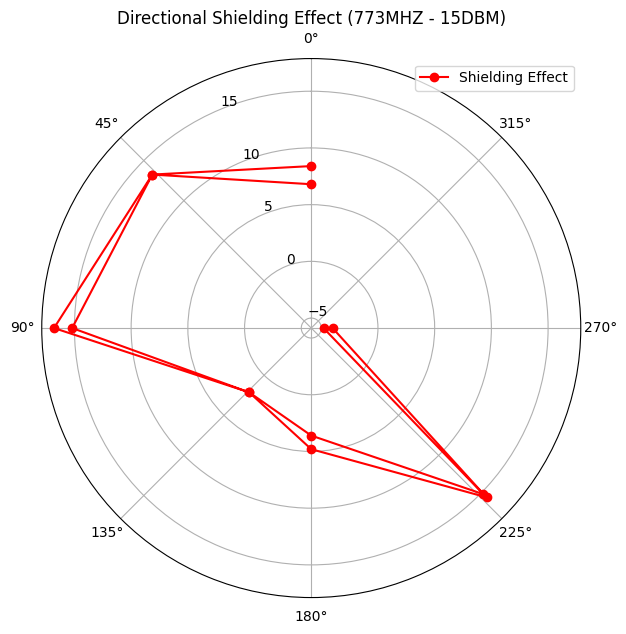


📊 Shielding Analysis for 773MHZ - 18DBM
    Angle (°)  Difference (Original - Sensor)
14        0.0                            10.0
15       46.0                            15.6
16       90.0                            12.8
17      136.0                             2.4
18      180.0                             3.6
19      226.0                            12.8
20      270.0                            -7.2
21      270.0                            -5.6
22      226.0                            14.8
23      180.0                             4.8
24      136.0                             2.0
25       90.0                            12.8
26       46.0                            14.8
27        0.0                             8.0
Mean Shielding: 7.257142857142855 dB
Median Shielding: 9.0 dB
Max Shielding: 15.600000000000001 dB at 46.0 °
Min Shielding: -7.20000000000001 dB at 270.0 °


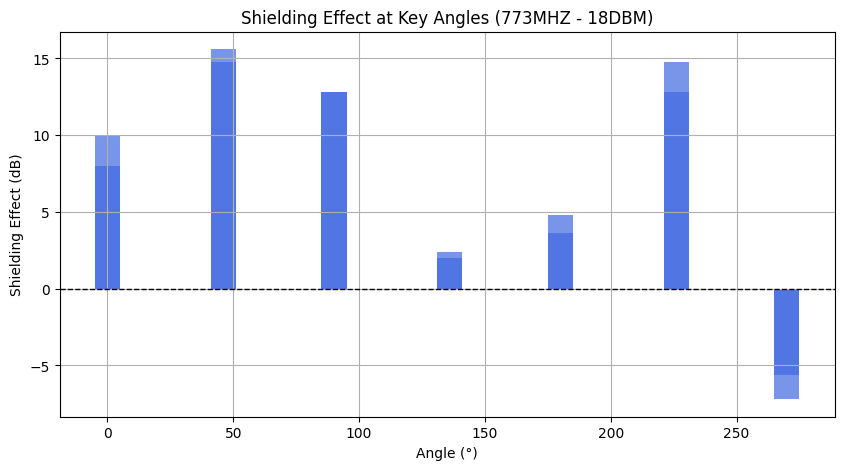

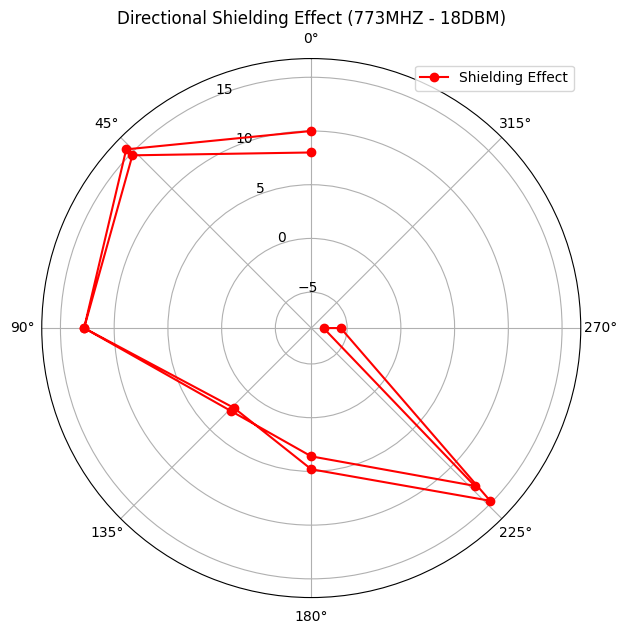


📊 Shielding Analysis for 942.5MHZ - 15DBM
    Angle (°)  Difference (Original - Sensor)
28        0.0                             1.6
29       46.0                            -4.0
30       90.0                             0.8
31      136.0                            -0.8
32      180.0                            -4.8
33      226.0                            -3.6
34      270.0                             2.4
35      270.0                             0.8
36      226.0                            -3.6
37      180.0                            -4.8
38      136.0                            -0.8
39       90.0                             0.4
40       46.0                            -4.8
41        0.0                             2.4
Mean Shielding: -1.3428571428571427 dB
Median Shielding: -0.7999999999999972 dB
Max Shielding: 2.3999999999999986 dB at 270.0 °
Min Shielding: -4.800000000000004 dB at 46.0 °


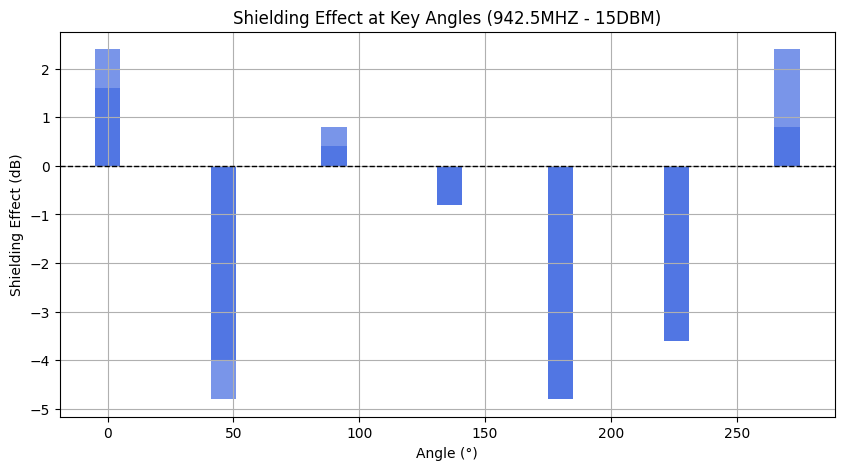

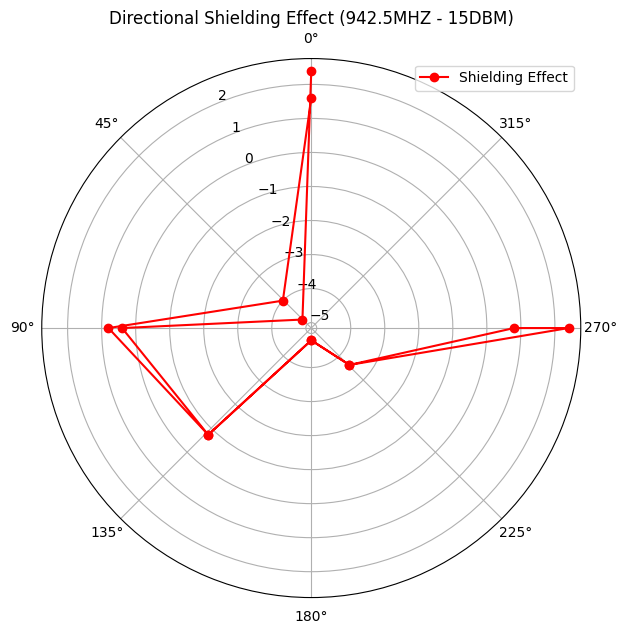


📊 Shielding Analysis for 942.5MHZ - 18DBM
    Angle (°)  Difference (Original - Sensor)
42        0.0                             1.2
43       46.0                            -5.2
44       90.0                             0.4
45      136.0                             0.0
46      180.0                            -4.4
47      226.0                            -4.0
48      270.0                             2.0
49      270.0                             1.2
50      226.0                            -3.6
51      180.0                            -4.8
52      136.0                             0.4
53       90.0                             0.4
54       46.0                            -4.8
55        0.0                             2.4
Mean Shielding: -1.3428571428571439 dB
Median Shielding: 0.1999999999999993 dB
Max Shielding: 2.400000000000002 dB at 0.0 °
Min Shielding: -5.200000000000003 dB at 46.0 °


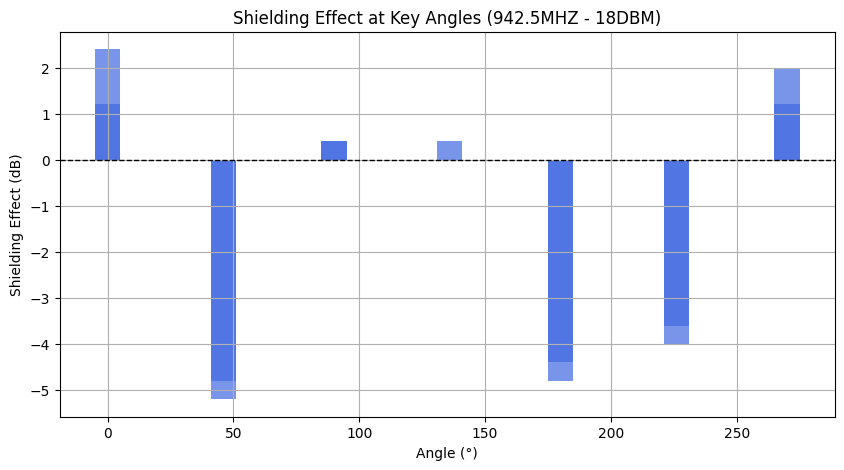

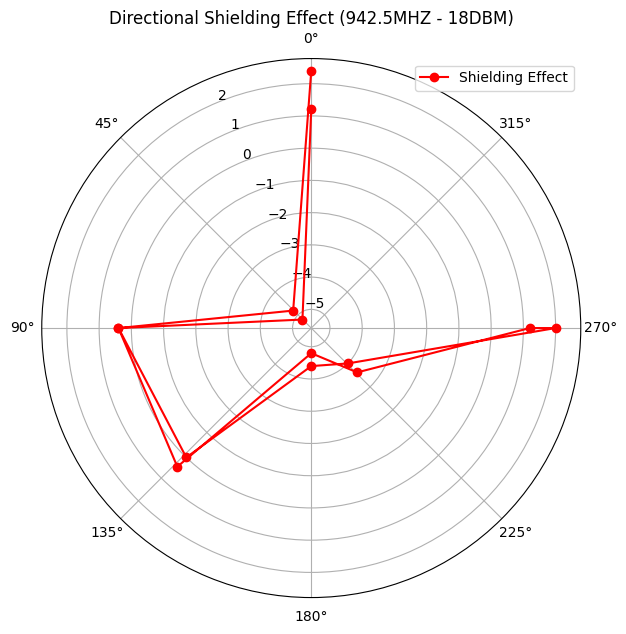

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Group data by frequency and source power
for (frequency, source_dbm), group in comparison_df.groupby(["Frequency", "Source dBm"]):
    # Extract angles and shielding effect
    angles = group["Angle (°)"]
    shielding_effect = group["Difference (Original - Sensor)"]

    # Print summary statistics
    print(f"\n📊 Shielding Analysis for {frequency.upper()} - {source_dbm.upper()}")
    print(group[["Angle (°)", "Difference (Original - Sensor)"]])
    print("Mean Shielding:", shielding_effect.mean(), "dB")
    print("Median Shielding:", shielding_effect.median(), "dB")
    print("Max Shielding:", shielding_effect.max(), "dB at", angles[shielding_effect.idxmax()], "°")
    print("Min Shielding:", shielding_effect.min(), "dB at", angles[shielding_effect.idxmin()], "°")

    # 🌍 Bar Plot of Shielding Effect
    plt.figure(figsize=(10, 5))
    plt.bar(angles, shielding_effect, width=10, color="royalblue", alpha=0.7)
    plt.xlabel("Angle (°)")
    plt.ylabel("Shielding Effect (dB)")
    plt.title(f"Shielding Effect at Key Angles ({frequency.upper()} - {source_dbm.upper()})")
    plt.axhline(0, color="black", linestyle="dashed", linewidth=1)
    plt.grid(True)
    plt.show()

    # 🌀 Polar Plot of Shielding Effect
    plt.figure(figsize=(7, 7))
    ax = plt.subplot(111, projection="polar")
    theta = np.radians(angles)  # Convert degrees to radians
    ax.plot(theta, shielding_effect, marker="o", linestyle="-", color="red", label="Shielding Effect")
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(1)
    ax.set_xticks(np.radians([0, 45, 90, 135, 180, 225, 270, 315]))
    ax.set_xticklabels(["0°", "45°", "90°", "135°", "180°", "225°", "270°", "315°"])
    ax.set_title(f"Directional Shielding Effect ({frequency.upper()} - {source_dbm.upper()})")
    ax.legend()
    plt.show()



📊 Shielding Trend Analysis for 1842.5MHZ - 15DBM
✅ Angles where shielding is always positive (attenuation occurs): [46.0, 90.0, 90.0, 270.0, 270.0]
❌ Angles where shielding is always negative (unexpected gain): [0.0, 0.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0]


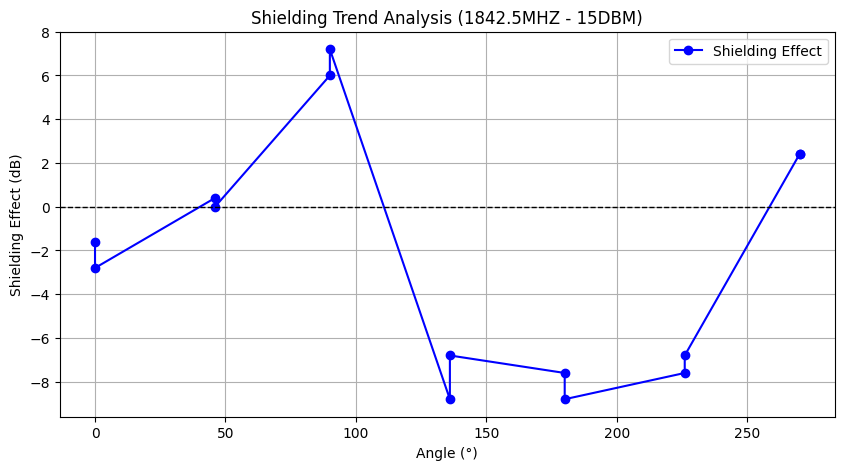


📊 Shielding Trend Analysis for 1842.5MHZ - 18DBM
✅ Angles where shielding is always positive (attenuation occurs): [90.0, 90.0, 270.0, 270.0]
❌ Angles where shielding is always negative (unexpected gain): [0.0, 0.0, 46.0, 46.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0]


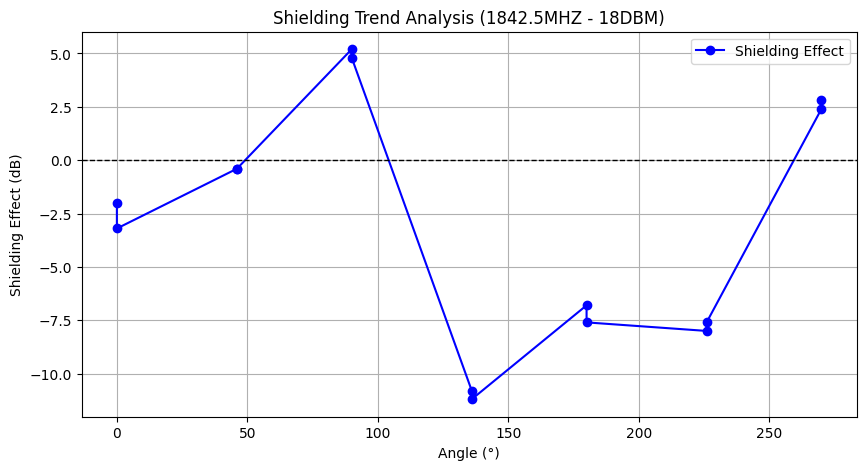


📊 Shielding Trend Analysis for 2140MHZ - 15DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 46.0, 46.0, 136.0, 136.0]
❌ Angles where shielding is always negative (unexpected gain): [90.0, 90.0, 180.0, 180.0, 226.0, 226.0, 270.0, 270.0]


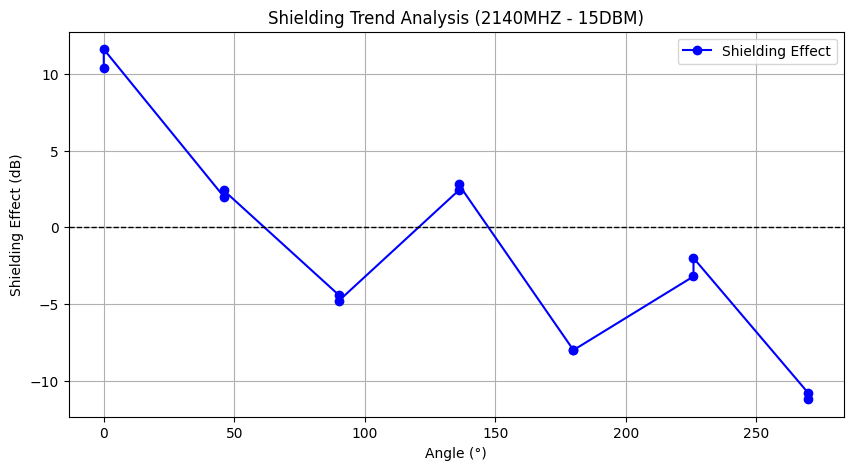


📊 Shielding Trend Analysis for 2140MHZ - 18DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 46.0, 46.0, 136.0, 136.0]
❌ Angles where shielding is always negative (unexpected gain): [90.0, 90.0, 180.0, 180.0, 226.0, 226.0, 270.0, 270.0]


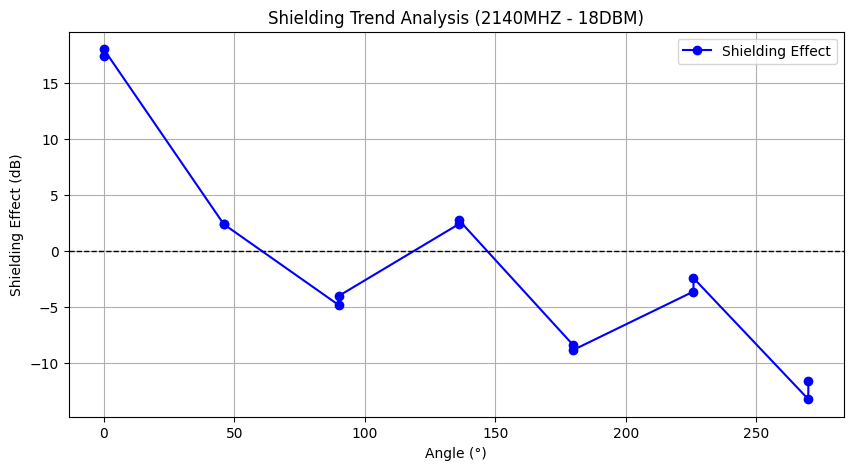


📊 Shielding Trend Analysis for 3600MHZ - 15DBM
✅ Angles where shielding is always positive (attenuation occurs): []
❌ Angles where shielding is always negative (unexpected gain): [0.0, 0.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0, 270.0, 270.0]


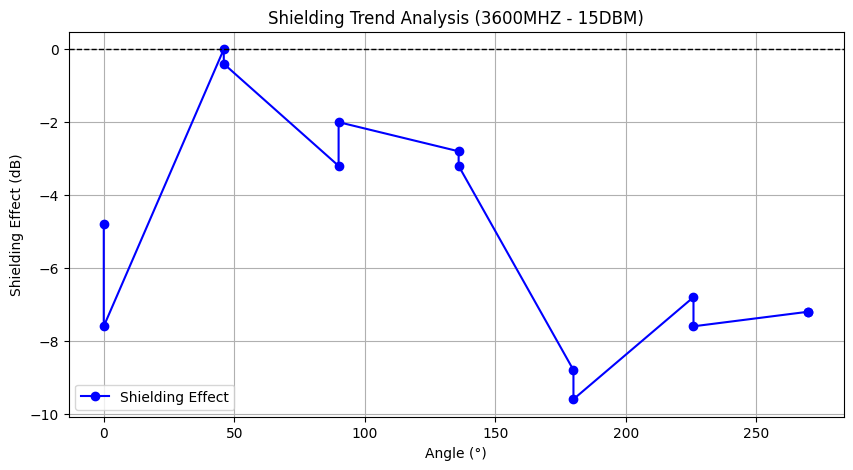


📊 Shielding Trend Analysis for 3600MHZ - 18DBM
✅ Angles where shielding is always positive (attenuation occurs): []
❌ Angles where shielding is always negative (unexpected gain): [0.0, 0.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0, 270.0, 270.0]


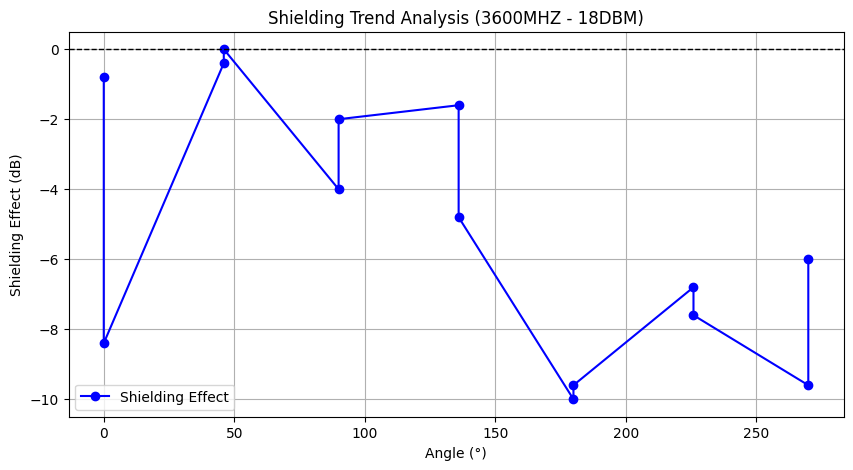


📊 Shielding Trend Analysis for 773MHZ - 15DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 46.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0]
❌ Angles where shielding is always negative (unexpected gain): [270.0, 270.0]


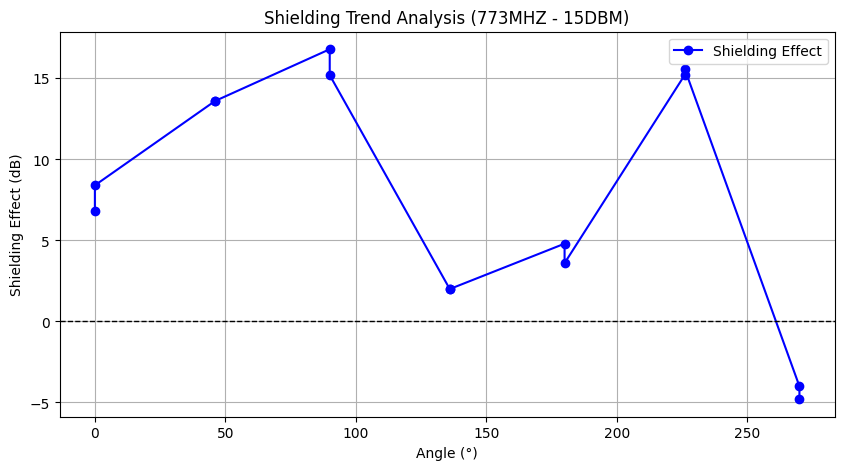


📊 Shielding Trend Analysis for 773MHZ - 18DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 46.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0]
❌ Angles where shielding is always negative (unexpected gain): [270.0, 270.0]


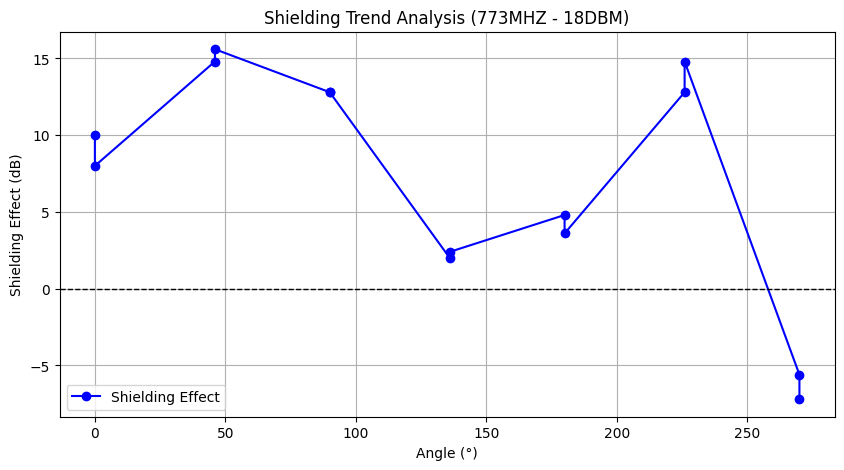


📊 Shielding Trend Analysis for 942.5MHZ - 15DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 90.0, 90.0, 270.0, 270.0]
❌ Angles where shielding is always negative (unexpected gain): [46.0, 46.0, 136.0, 136.0, 180.0, 180.0, 226.0, 226.0]


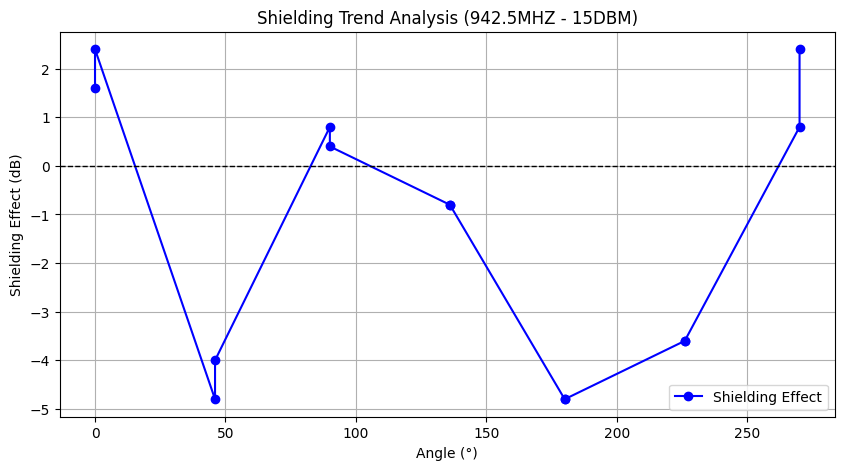


📊 Shielding Trend Analysis for 942.5MHZ - 18DBM
✅ Angles where shielding is always positive (attenuation occurs): [0.0, 0.0, 90.0, 90.0, 136.0, 270.0, 270.0]
❌ Angles where shielding is always negative (unexpected gain): [46.0, 46.0, 180.0, 180.0, 226.0, 226.0]


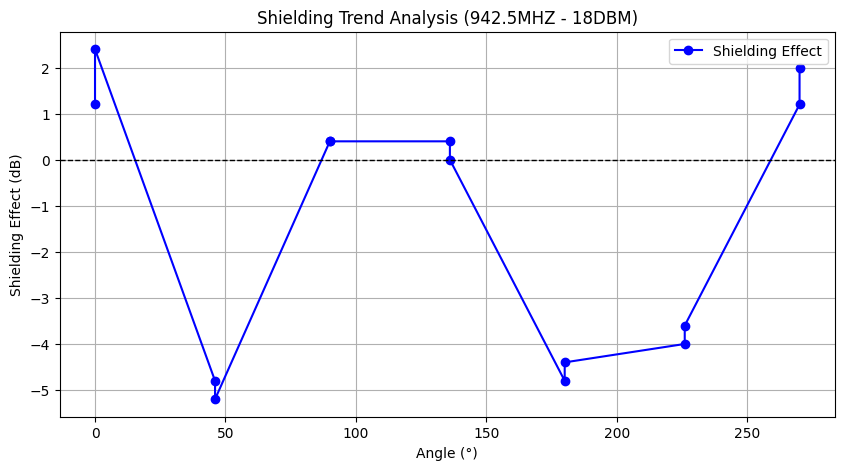

Always Positive (Shielding)  \
1842.5mhz 15dbm                   [46.0, 90.0, 90.0, 270.0, 270.0]   
          18dbm                         [90.0, 90.0, 270.0, 270.0]   
2140mhz   15dbm               [0.0, 0.0, 46.0, 46.0, 136.0, 136.0]   
          18dbm               [0.0, 0.0, 46.0, 46.0, 136.0, 136.0]   
3600mhz   15dbm                                                 []   
          18dbm                                                 []   
773mhz    15dbm  [0.0, 0.0, 46.0, 46.0, 90.0, 90.0, 136.0, 136....   
          18dbm  [0.0, 0.0, 46.0, 46.0, 90.0, 90.0, 136.0, 136....   
942.5mhz  15dbm               [0.0, 0.0, 90.0, 90.0, 270.0, 270.0]   
          18dbm        [0.0, 0.0, 90.0, 90.0, 136.0, 270.0, 270.0]   

                                      Always Negative (Unexpected)  
1842.5mhz 15dbm  [0.0, 0.0, 136.0, 136.0, 180.0, 180.0, 226.0, ...  
          18dbm  [0.0, 0.0, 46.0, 46.0, 136.0, 136.0, 180.0, 18...  
2140mhz   15dbm  [90.0, 90.0, 180.0, 180.0, 226.0, 226.0, 270.0...  
          18dbm  [90.0, 90.0, 180.0, 180.0, 226.0, 226.0, 270.0...  
3600mhz   15dbm  [0.0, 0.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180...  
          18dbm  [0.0, 0.0, 46.0, 90.0, 90.0, 136.0, 136.0, 180...  
773mhz    15dbm                                     [270.0, 270.0]  
          18dbm                                     [270.0, 270.0]  
942.5mhz  15dbm  [46.0, 46.0, 136.0, 136.0, 180.0, 180.0, 226.0...  
          18dbm           [46.0, 46.0, 180.0, 180.0, 226.0, 226.0]

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to store key angle results
key_angles_dict = {}

for (frequency, source_dbm), group in comparison_df.groupby(["Frequency", "Source dBm"]):
    # Sort by angle
    group = group.sort_values("Angle (°)")
    
    # Extract angles and shielding effect
    angles = group["Angle (°)"]
    shielding_effect = group["Difference (Original - Sensor)"]

    # Identify consistently positive and negative angles
    always_positive = group[group["Difference (Original - Sensor)"] > 0]["Angle (°)"].tolist()
    always_negative = group[group["Difference (Original - Sensor)"] < 0]["Angle (°)"].tolist()

    # Save results
    key_angles_dict[(frequency, source_dbm)] = {
        "Always Positive (Shielding)": always_positive,
        "Always Negative (Unexpected)": always_negative
    }

    # Print findings
    print(f"\n📊 Shielding Trend Analysis for {frequency.upper()} - {source_dbm.upper()}")
    print(f"✅ Angles where shielding is always positive (attenuation occurs): {always_positive}")
    print(f"❌ Angles where shielding is always negative (unexpected gain): {always_negative}")

    # 📈 Plot the shielding effect
    plt.figure(figsize=(10, 5))
    plt.plot(angles, shielding_effect, marker="o", linestyle="-", color="blue", label="Shielding Effect")
    plt.axhline(0, color="black", linestyle="dashed", linewidth=1)
    plt.xlabel("Angle (°)")
    plt.ylabel("Shielding Effect (dB)")
    plt.title(f"Shielding Trend Analysis ({frequency.upper()} - {source_dbm.upper()})")
    plt.grid(True)
    plt.legend()
    plt.show()

# Convert results to a DataFrame (optional)
key_angles_df = pd.DataFrame.from_dict(key_angles_dict, orient="index")

# Display extracted key angles
key_angles_df


doe zelf eens kijk waar negatief shielding en kijk welke hoek altijd over alle/ of de meeste frequenties heen 